<h2 style = "color:red">import library </h2>

In [2]:
import pandas as pd, numpy as np, seaborn as sb, matplotlib.pyplot as plt, matplotlib.dates as mdates
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split, cross_val_score, KFold , GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LinearRegression, LogisticRegression, LassoCV, RidgeCV, ElasticNetCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler


<h2 style = "color:red">import data </h2>
We have two different data files<br>
1- student-mat<br>
2- student-por<br>


In [3]:
data_mat = pd.read_csv("student-mat.csv")
data_por = pd.read_csv("student-por.csv")


<h2 style = "color:red">merge data</h2>
1- In this part, two types of data were merged and stored in (data)<br><br>
2- The how='outer' parameter specifies that the merge is an outer join, meaning that it will include all rows from both DataFrames regardless of whether there is a match or not<br><br>
3- The resulting DataFrame data will have a combination of columns from both data_mat and data_por, with NaN values (missing values) filled in where there are no matches between the two DataFrames.<br><br>
4- shape of new data

In [4]:
data = pd.merge(data_mat, data_por, how = 'outer')
data.shape

(1044, 33)

In [16]:
pd.concat([data_mat,data_por]) #

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,4,6,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644,MS,F,19,R,GT3,T,2,3,services,other,...,5,4,2,1,2,5,4,10,11,10
645,MS,F,18,U,LE3,T,3,1,teacher,services,...,4,3,4,1,1,1,4,15,15,16
646,MS,F,18,U,GT3,T,1,1,other,other,...,1,1,1,1,1,5,6,11,12,9
647,MS,M,17,U,LE3,T,3,1,services,services,...,2,4,5,3,4,2,6,10,10,10


<h2 style = "color:red">check data</h2>
1- non value <br>
2- duplicated

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1044 entries, 0 to 1043
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   school      1044 non-null   object
 1   sex         1044 non-null   object
 2   age         1044 non-null   int64 
 3   address     1044 non-null   object
 4   famsize     1044 non-null   object
 5   Pstatus     1044 non-null   object
 6   Medu        1044 non-null   int64 
 7   Fedu        1044 non-null   int64 
 8   Mjob        1044 non-null   object
 9   Fjob        1044 non-null   object
 10  reason      1044 non-null   object
 11  guardian    1044 non-null   object
 12  traveltime  1044 non-null   int64 
 13  studytime   1044 non-null   int64 
 14  failures    1044 non-null   int64 
 15  schoolsup   1044 non-null   object
 16  famsup      1044 non-null   object
 17  paid        1044 non-null   object
 18  activities  1044 non-null   object
 19  nursery     1044 non-null   object
 20  higher  

In [6]:
data.drop_duplicates(inplace= True)

In [7]:
data.duplicated().sum()

0

In [8]:
data.duplicated().any()

False

<h2 style = "color:red">after check data</h2>
1- no non value<br>
2- no duplicated


<h2 style = "color:red">display all data</h2>
1- to more check data<br>
2- it is comment Because of the large size data<br>
3- the result was the same as before


In [9]:
#pd.set_option('display.max_rows',None,'display.max_colwidth',None,'display.max_columns',None)
#data

In [10]:
data.sample(25)

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
1035,MS,M,19,R,GT3,T,1,1,other,services,...,4,3,2,1,3,5,0,5,8,0
139,GP,F,16,U,GT3,T,3,3,other,services,...,4,3,3,2,4,5,4,11,11,11
169,GP,F,16,U,LE3,T,1,1,at_home,at_home,...,3,4,4,3,3,1,2,14,14,13
23,GP,F,15,U,GT3,A,4,3,services,services,...,4,3,2,1,1,1,0,14,15,15
557,GP,M,16,U,GT3,T,3,3,services,other,...,5,3,3,1,1,5,4,13,14,14
511,GP,M,16,R,GT3,T,2,1,other,other,...,3,3,2,1,3,3,2,14,13,12
615,GP,M,17,R,GT3,T,1,2,at_home,other,...,3,1,3,1,5,3,6,9,9,10
883,MS,F,18,R,GT3,T,1,1,other,other,...,4,3,2,1,2,4,2,8,8,10
73,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
770,GP,M,22,U,GT3,T,3,1,services,services,...,5,4,5,5,5,1,12,7,8,5


<h2 style = "color:red">Statistical Analysis</h2>
describe

In [11]:
data.describe()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
count,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000
mean,16.726054,2.603448,2.387931,1.522989,1.970307,0.264368,3.935824,3.201149,3.156130,1.494253,2.284483,3.543103,4.434866,11.213602,11.246169,11.341954
std,1.239975,1.124907,1.099938,0.731727,0.834353,0.656142,0.933401,1.031507,1.152575,0.911714,1.285105,1.424703,6.210017,2.983394,3.285071,3.864796
min,15.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,16.000000,2.000000,1.000000,1.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,9.000000,9.000000,10.000000
50%,17.000000,3.000000,2.000000,1.000000,2.000000,0.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,2.000000,11.000000,11.000000,11.000000
75%,18.000000,4.000000,3.000000,2.000000,2.000000,0.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,6.000000,13.000000,13.000000,14.000000
max,22.000000,4.000000,4.000000,4.000000,4.000000,3.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,75.000000,19.000000,19.000000,20.000000


<h2 style = "color:red">Encoding Categorical Features</h2>
1- We need to transform data in all columns so that the model understands it<br><br>
2- in last we check data by (data.sample)<br><br>
3- No work done for (G1 , G2 , G3) Because I need the main values ​​and the truth for them because they have a main and strong relationship with output



In [12]:
enc = LabelEncoder()
data["school"] = enc.fit_transform(data["school"])

data["sex"] = enc.fit_transform(data["sex"])

data["age"] = enc.fit_transform(data["age"])

data["address"] = enc.fit_transform(data["address"])

data["famsize"] = enc.fit_transform(data["famsize"])

data["Pstatus"] = enc.fit_transform(data["Pstatus"])

data["Medu"] = enc.fit_transform(data["Medu"])

data["Fedu"] = enc.fit_transform(data["Fedu"])

data["Mjob"] = enc.fit_transform(data["Mjob"])

data["Fjob"] = enc.fit_transform(data["Fjob"])

data["reason"] = enc.fit_transform(data["reason"])

data["guardian"] = enc.fit_transform(data["guardian"])

data["traveltime"] = enc.fit_transform(data["traveltime"])

data["studytime"] = enc.fit_transform(data["studytime"])

data["failures"] = enc.fit_transform(data["failures"])

data["schoolsup"] = enc.fit_transform(data["schoolsup"])

data["famsup"] = enc.fit_transform(data["famsup"])

data["paid"] = enc.fit_transform(data["paid"])

data["activities"] = enc.fit_transform(data["activities"])

data["nursery"] = enc.fit_transform(data["nursery"])

data["higher"] = enc.fit_transform(data["higher"])

data["internet"] = enc.fit_transform(data["internet"])

data["romantic"] = enc.fit_transform(data["romantic"])

data["famrel"] = enc.fit_transform(data["famrel"])

data["freetime	"] = enc.fit_transform(data["freetime"])

data["goout"] = enc.fit_transform(data["goout"])

data["Dalc"] = enc.fit_transform(data["Dalc"])

data["Walc"] = enc.fit_transform(data["Walc"])

data["health"] = enc.fit_transform(data["health"])

data["absences"] = enc.fit_transform(data["absences"])

data.sample(5)




,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,freetime\t
582,0,1,1,1,0,1,4,4,4,4,...,4,4,4,4,4,16,10,12,11,3
217,0,0,2,0,1,1,4,4,3,2,...,2,0,0,1,2,12,8,10,10,1
885,1,0,3,0,0,1,2,2,0,2,...,3,2,0,0,3,0,9,0,0,2
803,1,0,1,0,0,1,4,4,4,4,...,2,1,0,0,3,6,16,16,17,1
356,0,0,3,1,0,1,2,4,3,0,...,4,2,0,0,2,8,14,12,12,3


<h2 style = "color:red">Drop unnecessary columns</h2>
1- The reason for choosing a school does not fundamentally affect the final result<br><br>
2- Entering nursery does not have an impact because there are factors besides it, such as external learning, so it does not affect the final result in a fundamental way<br><br>
3- Relationships do not determine the final result and have nothing to do with it, remotely or closely<br><br>
4- we take sample(5) from data to check


In [13]:
data.drop("reason" , axis= 1 , inplace= True)
data.drop("nursery" , axis= 1 , inplace= True)
data.drop("romantic" , axis= 1 , inplace= True)
data.sample(5)

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,freetime\t
776,1,0,0,0,0,1,3,3,0,2,...,4,3,1,2,4,4,10,10,11,3
569,0,1,1,1,0,1,4,4,1,2,...,2,3,1,3,0,2,14,13,13,1
734,0,1,3,1,1,0,4,4,4,4,...,4,2,0,0,1,0,17,17,17,3
118,0,0,1,1,0,1,2,2,2,2,...,2,2,0,2,2,0,11,11,11,1
997,1,1,2,1,1,1,3,1,3,3,...,4,4,2,3,1,3,14,16,16,3


<h2 style = "color:red">Univariate Exploration</h2>

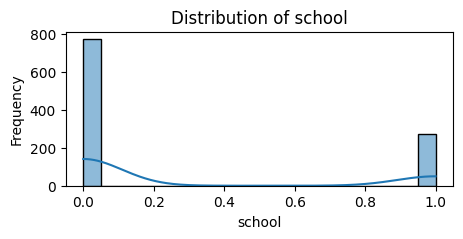

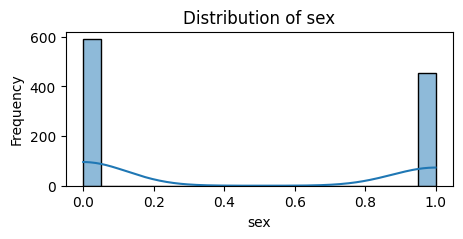

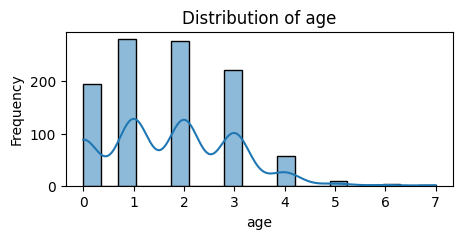

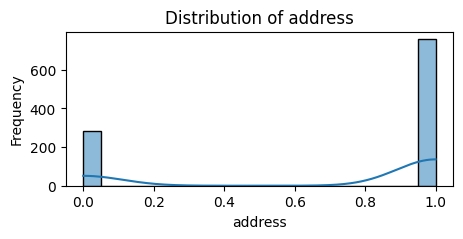

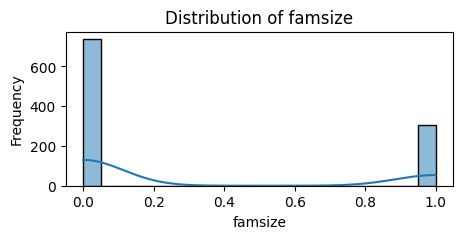

...

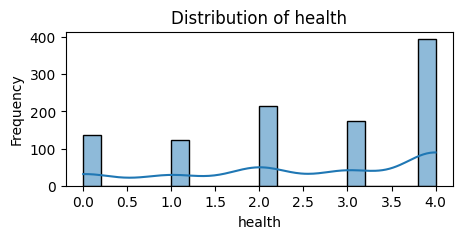

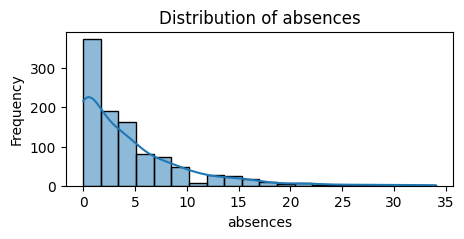

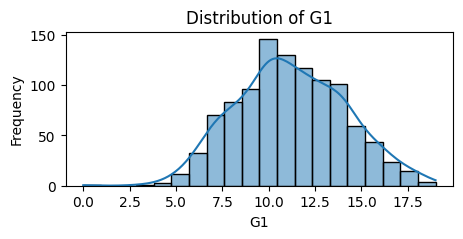

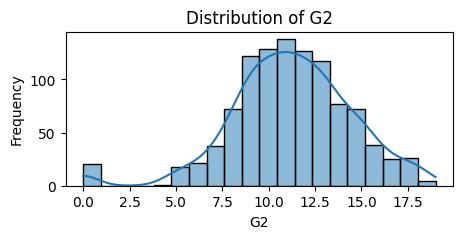

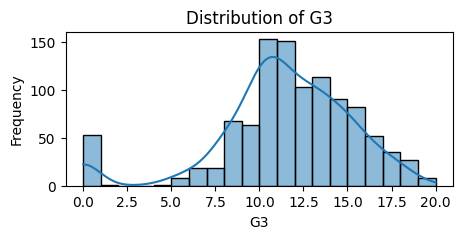

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


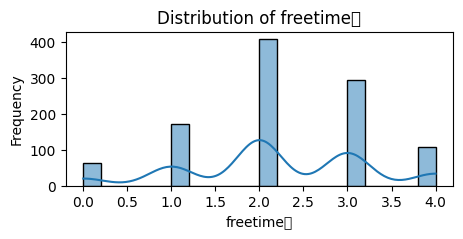

In [14]:
for column in data.columns:
    plt.figure(figsize=(5, 2))
    sns.histplot(data[column], bins=20, kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()



<h2 style = "color:red">Bivariate Exploration</h2>

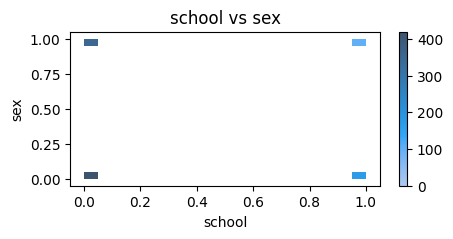

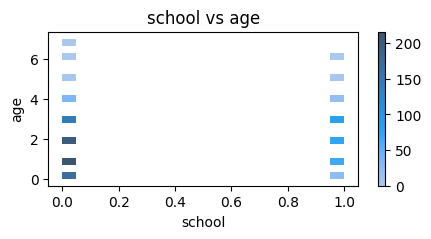

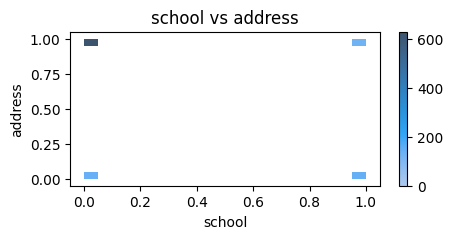

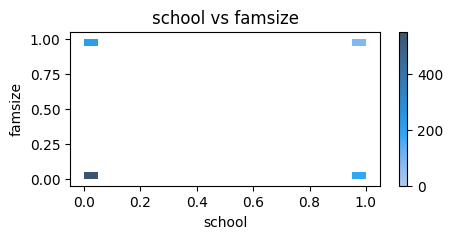

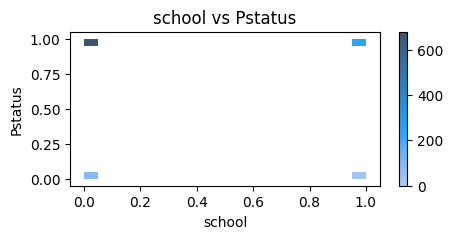

...

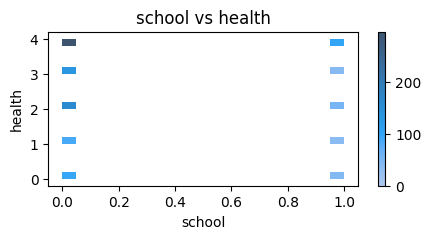

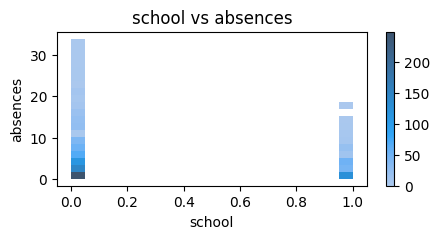

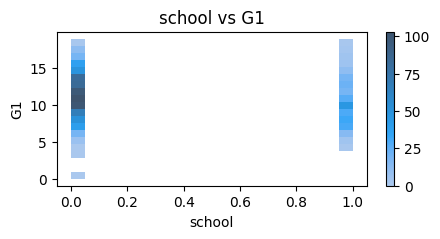

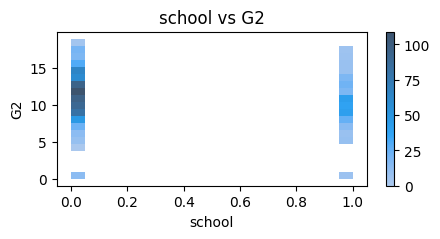

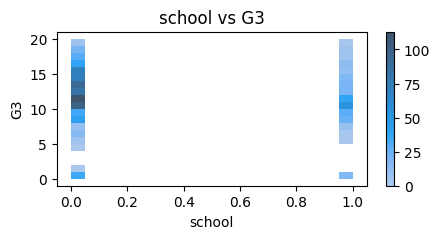

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


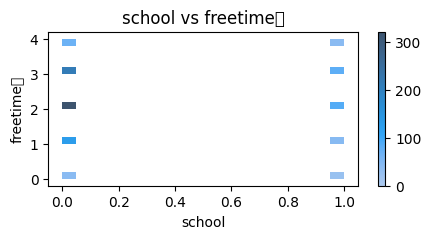

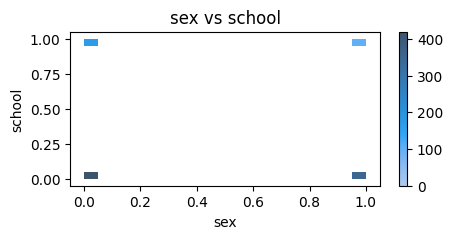

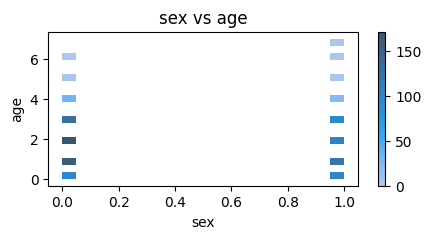

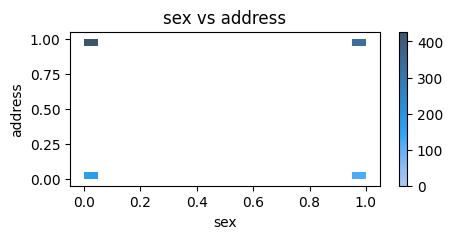

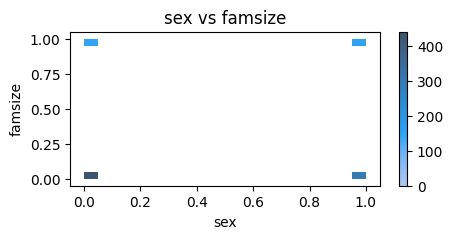

...

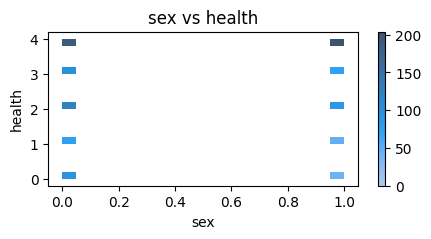

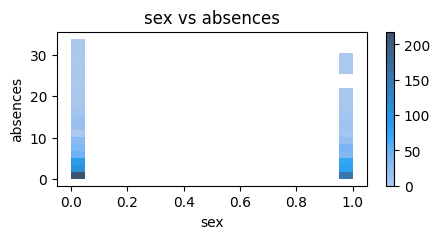

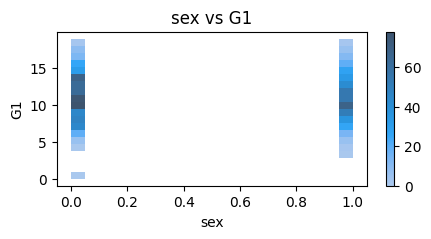

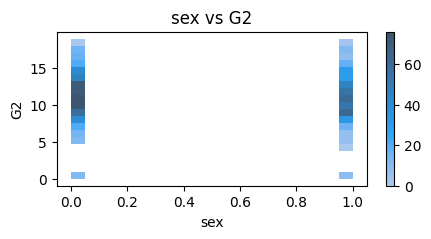

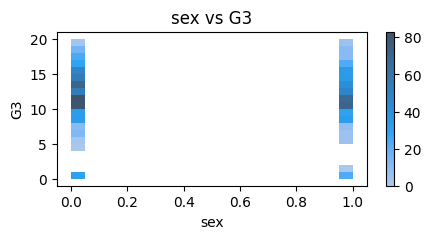

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


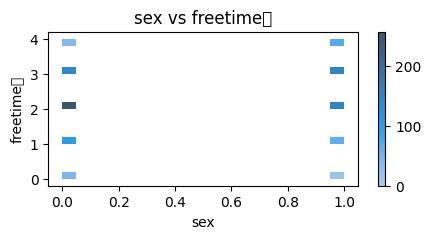

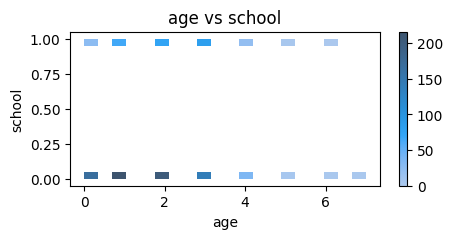

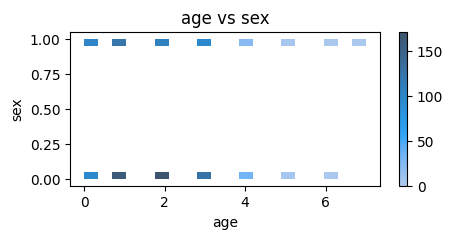

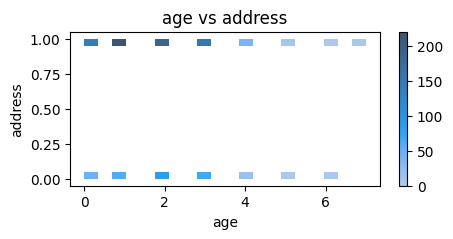

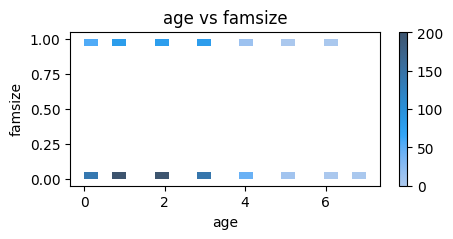

...

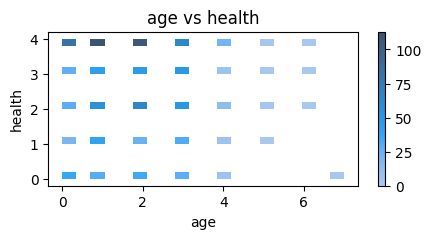

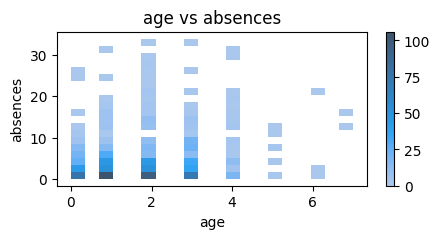

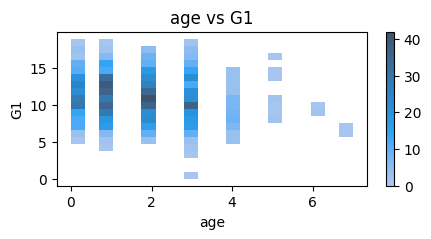

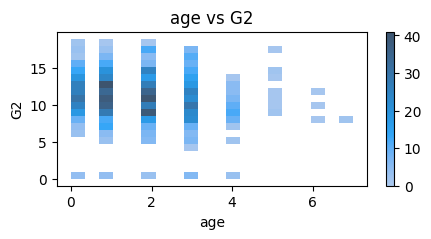

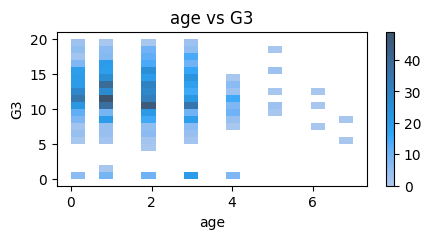

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


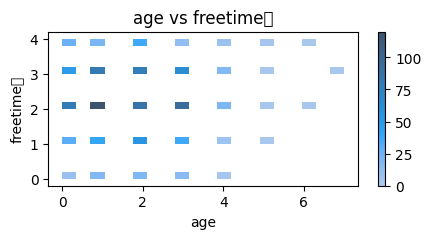

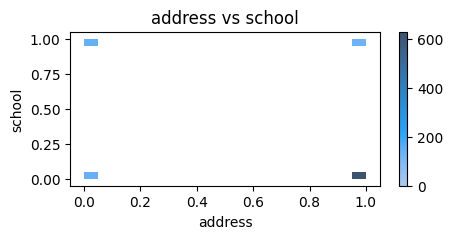

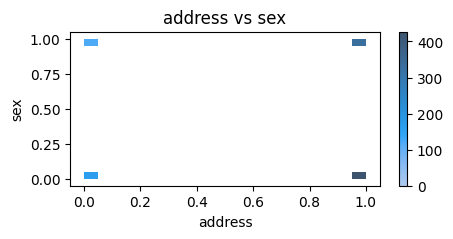

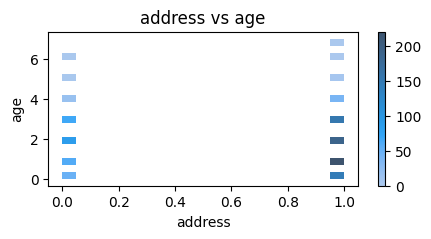

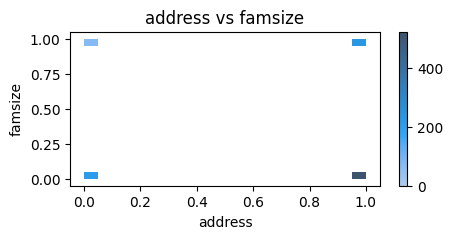

...

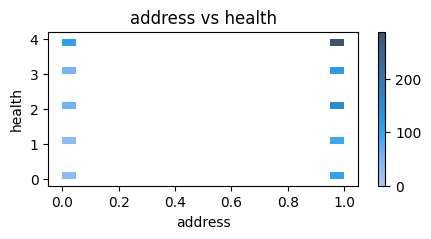

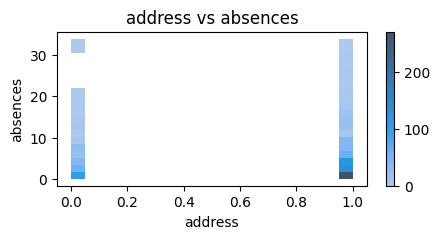

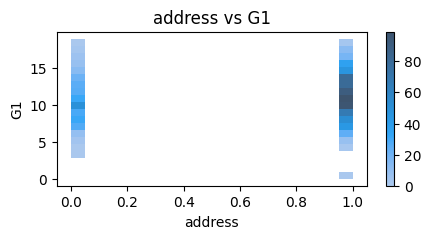

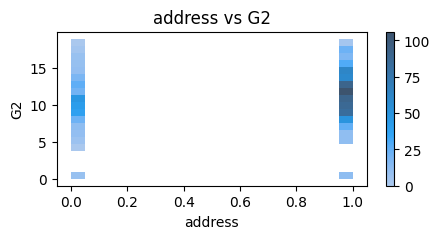

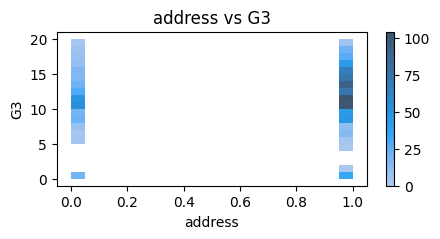

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


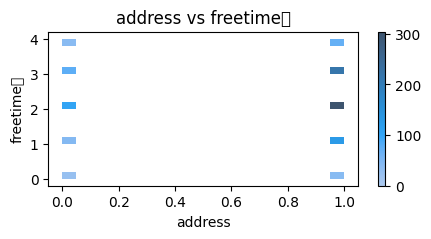

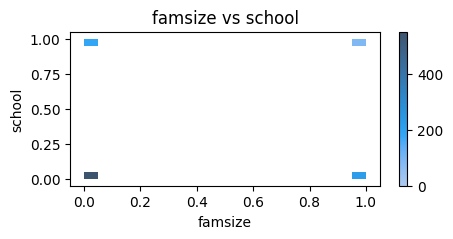

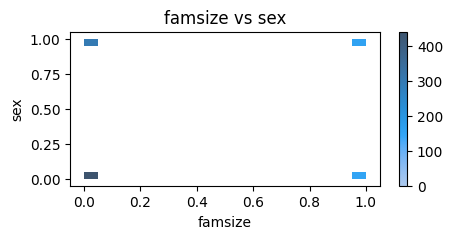

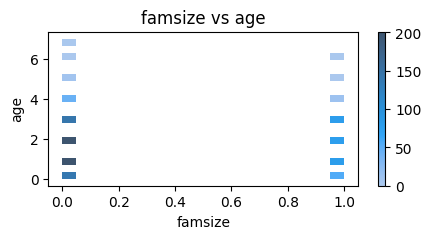

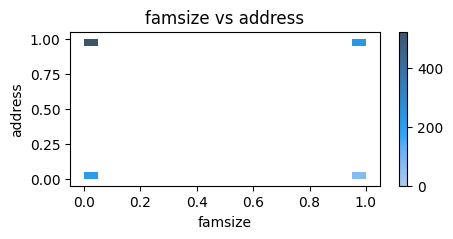

...

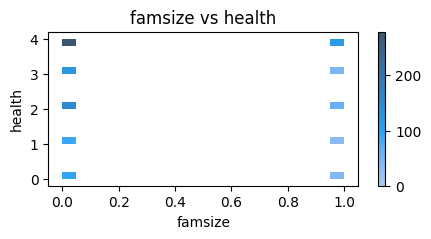

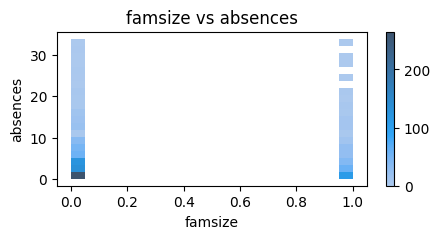

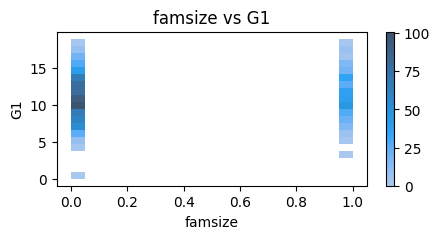

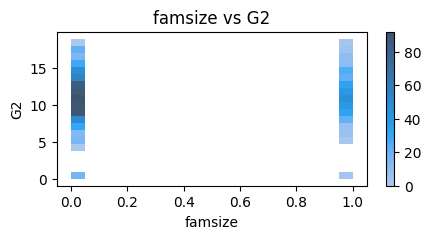

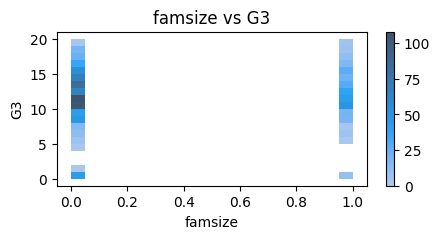

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


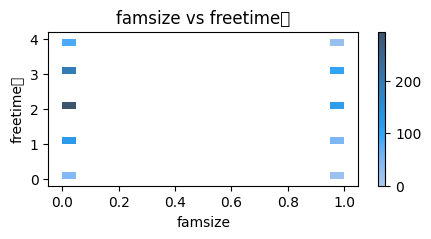

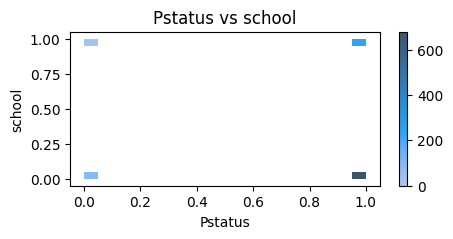

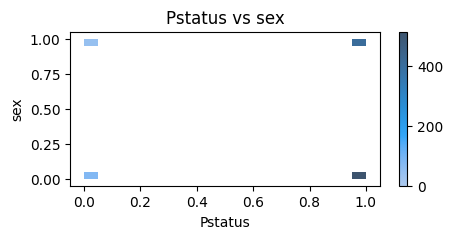

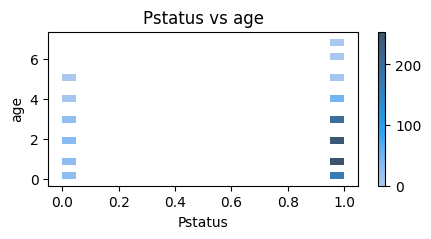

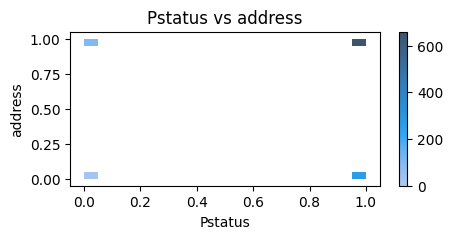

...

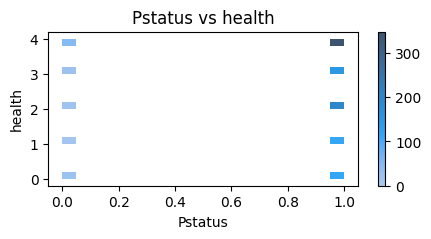

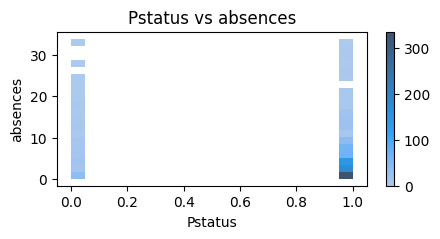

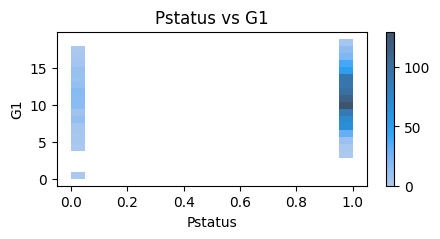

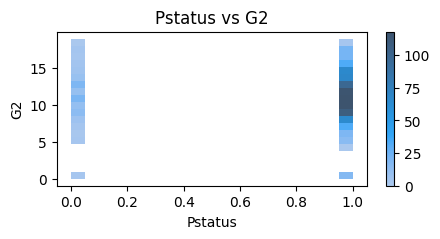

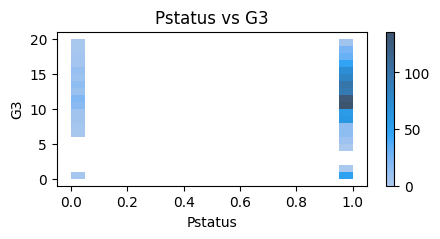

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


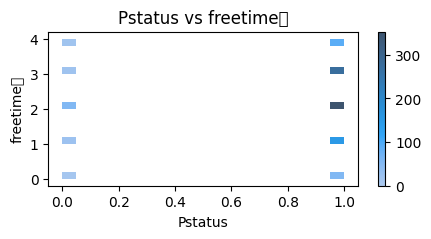

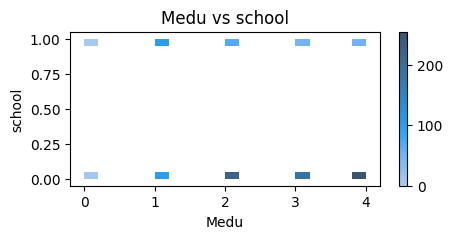

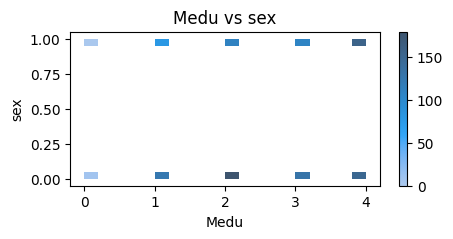

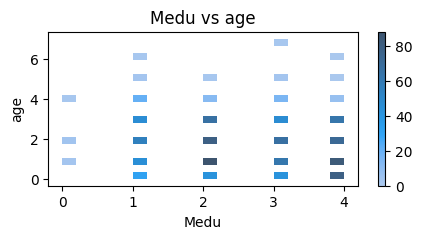

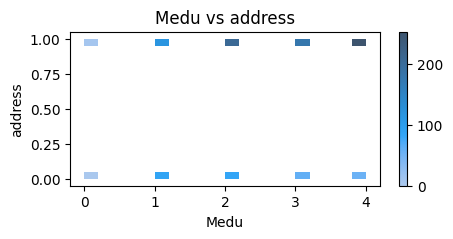

...

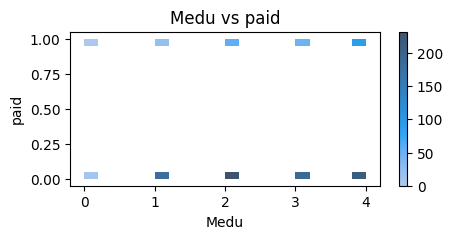

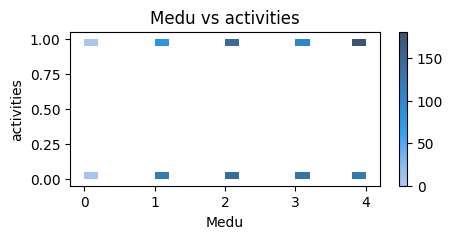

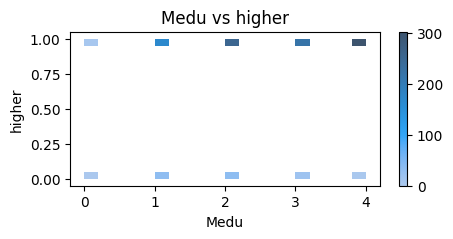

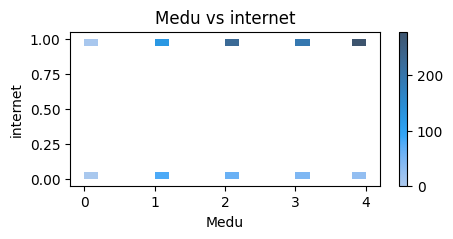

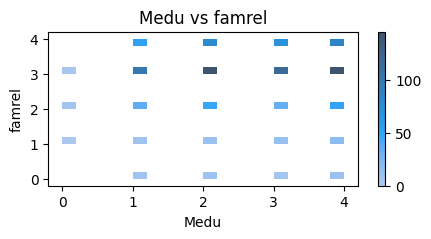

KeyboardInterrupt: 

In [15]:
for column1 in data.columns:
    for column2 in data.columns:
        if column1 == column2:
            continue
        plt.figure(figsize=(5, 2))
        sns.histplot(x=column1, y=column2, data=data, bins=20, cbar=True)
        plt.title(f'{column1} vs {column2}')
        plt.xlabel(column1)
        plt.ylabel(column2)
        plt.show()


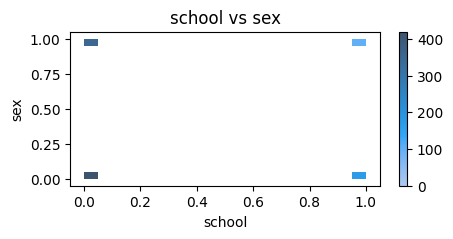

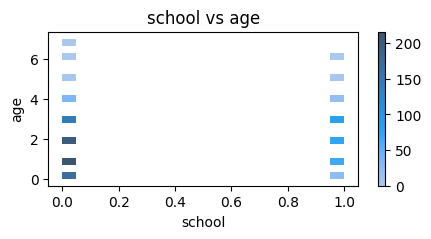

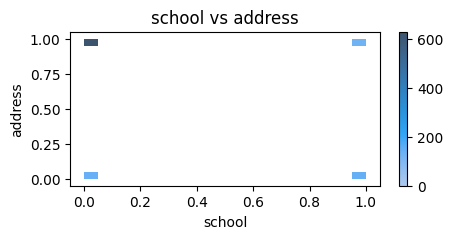

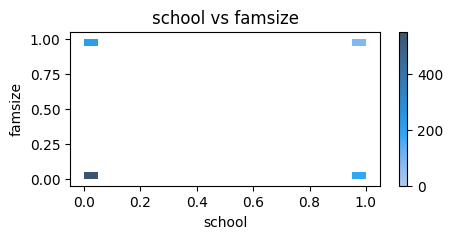

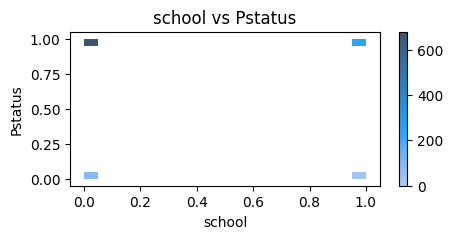

...

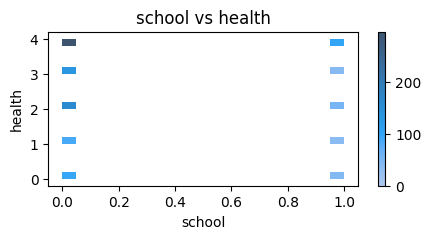

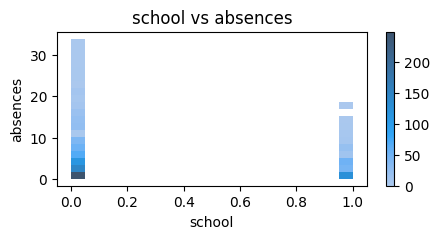

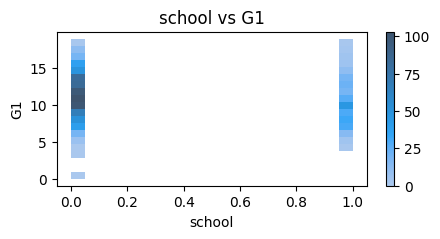

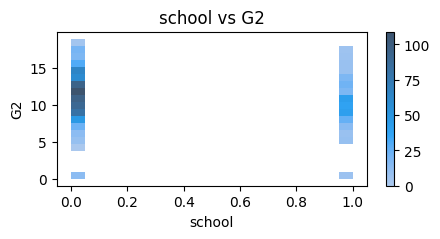

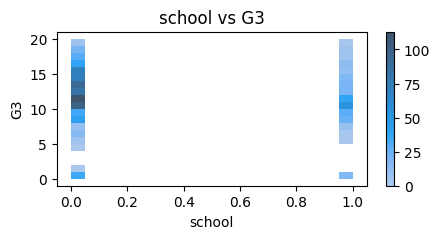

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


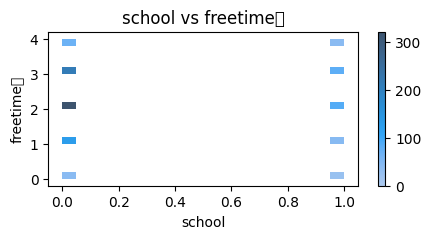

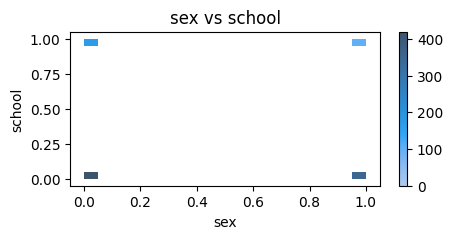

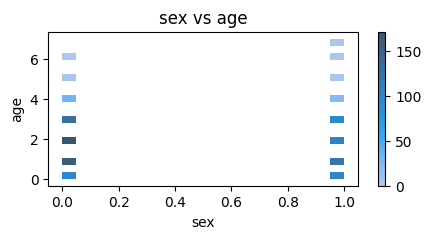

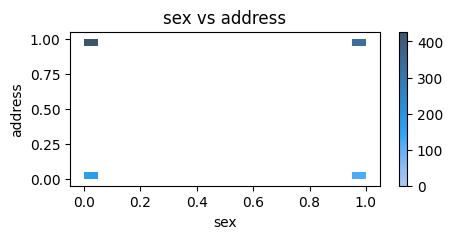

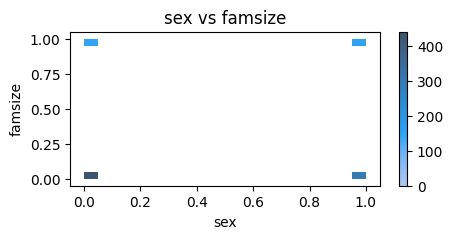

...

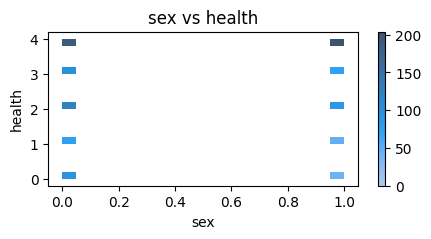

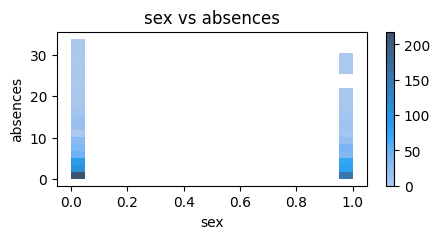

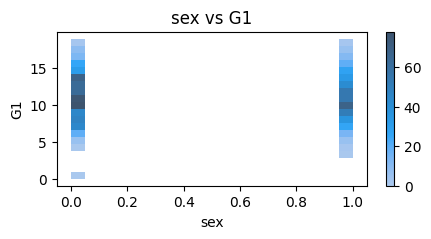

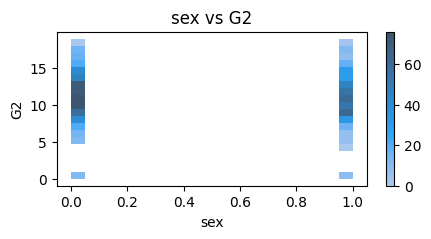

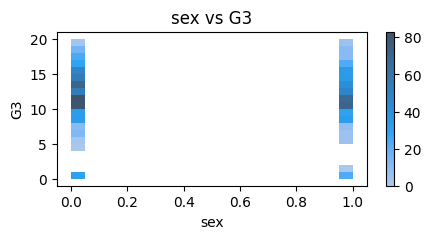

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


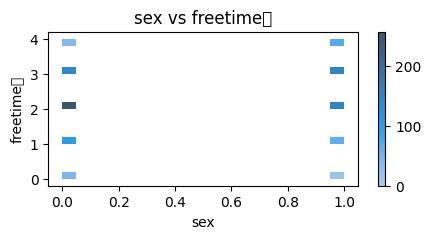

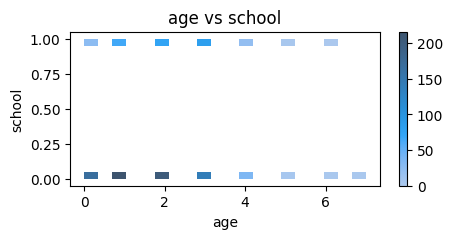

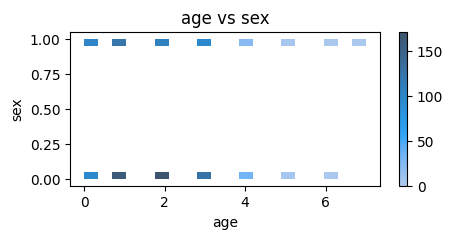

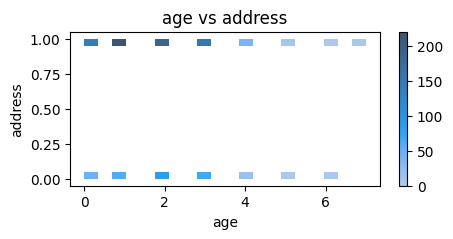

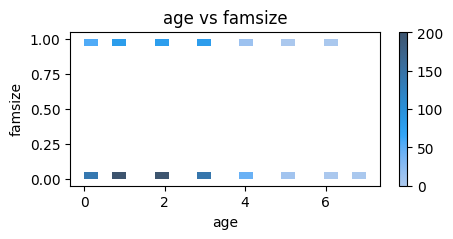

...

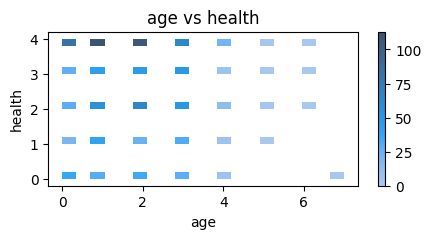

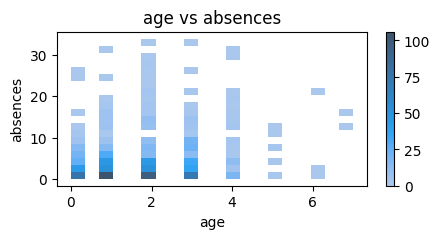

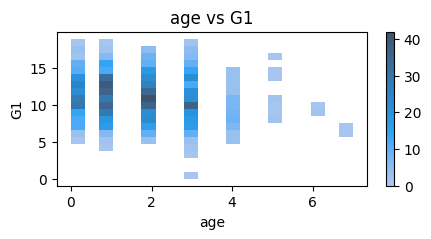

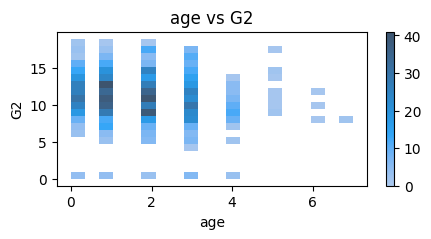

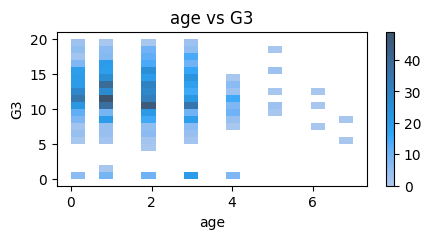

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


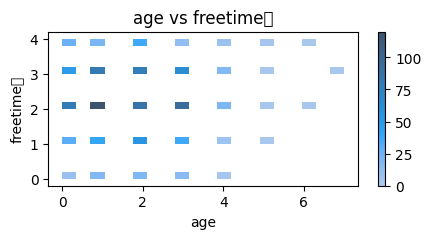

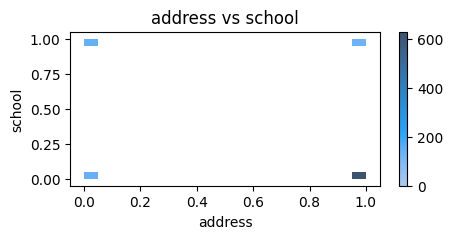

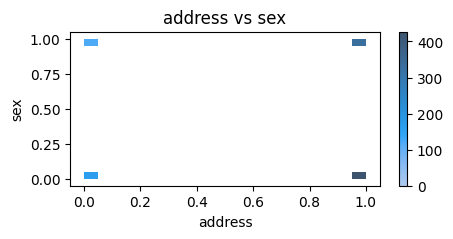

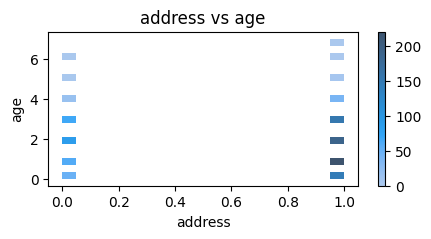

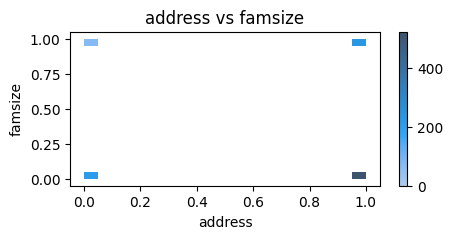

...

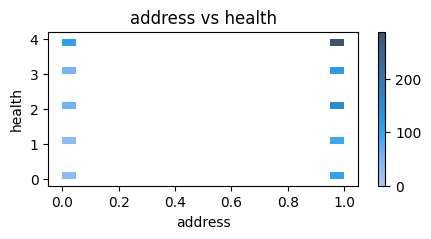

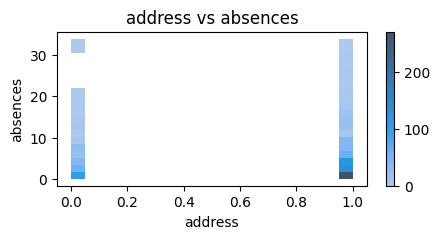

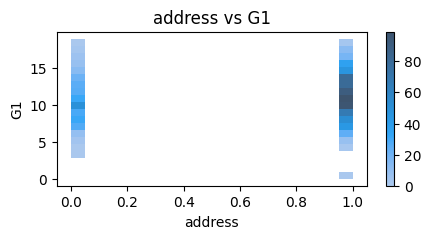

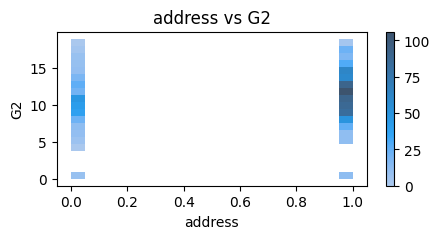

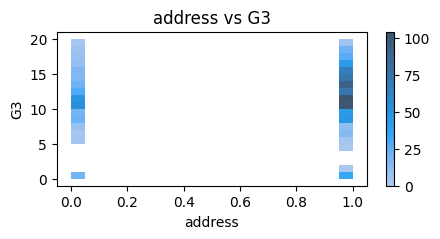

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


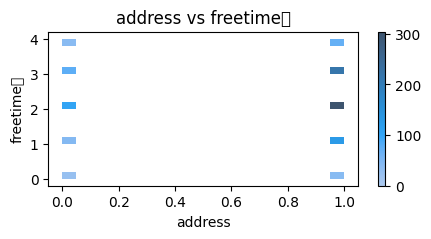

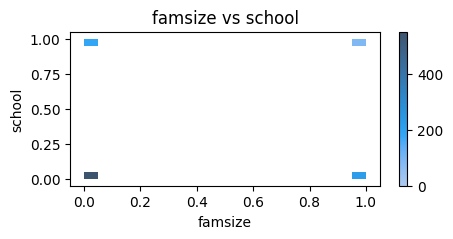

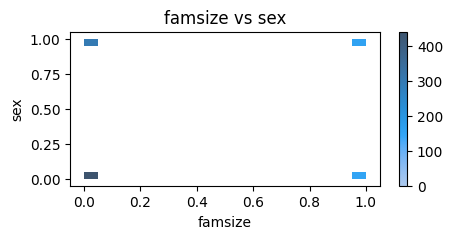

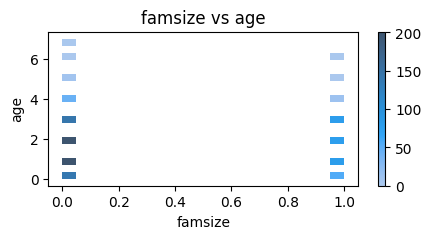

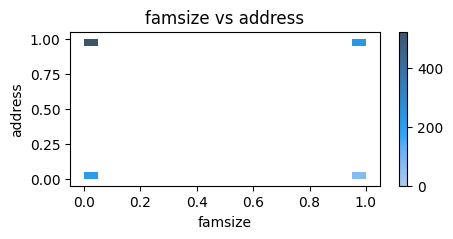

...

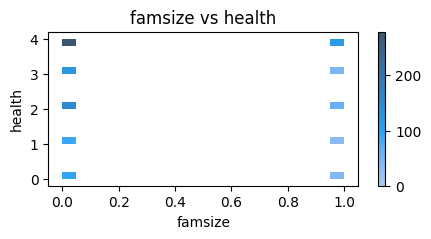

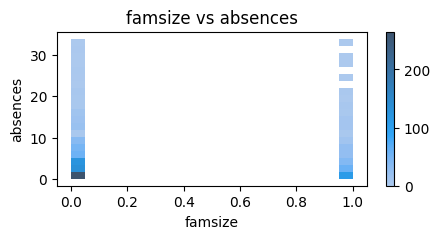

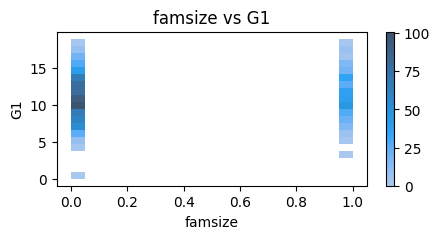

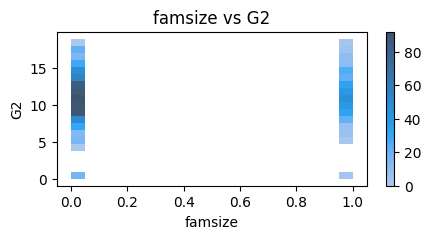

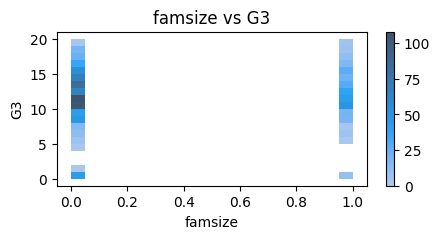

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


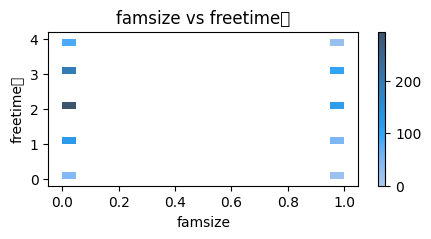

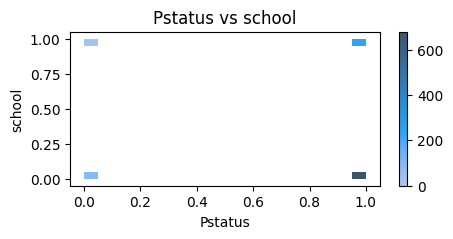

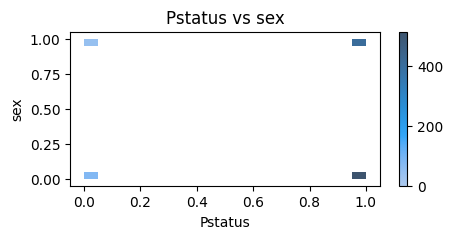

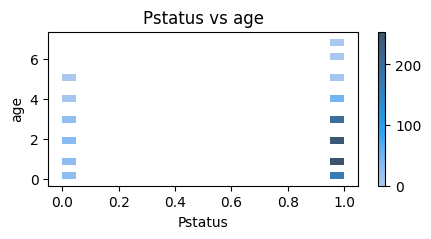

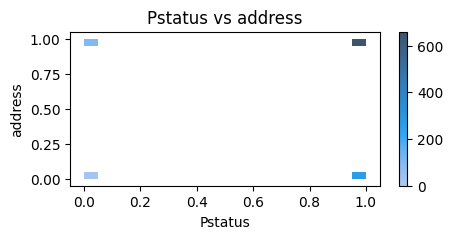

...

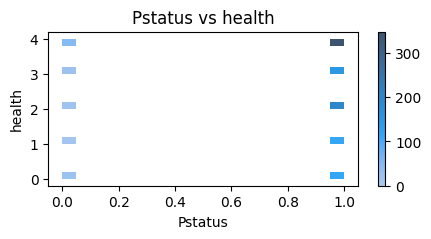

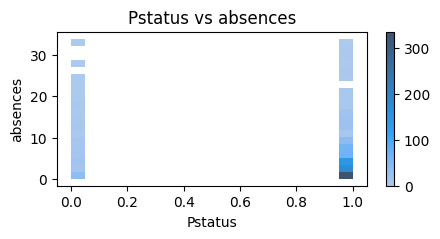

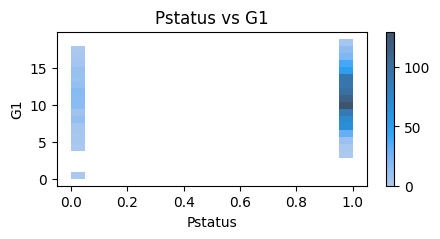

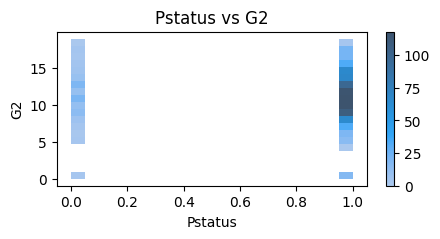

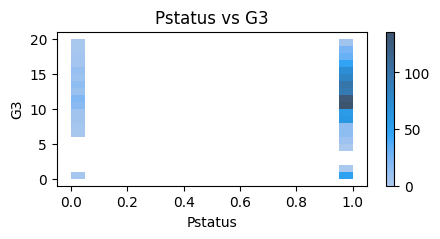

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


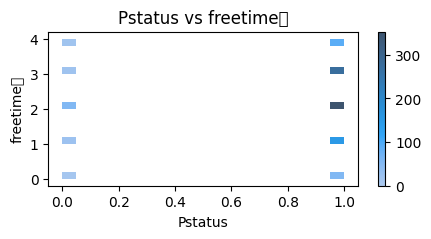

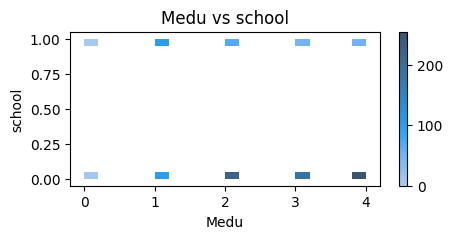

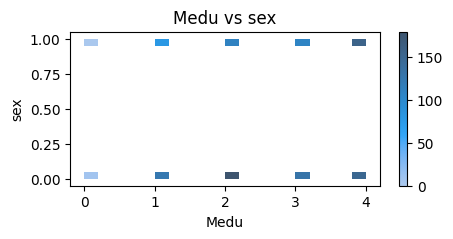

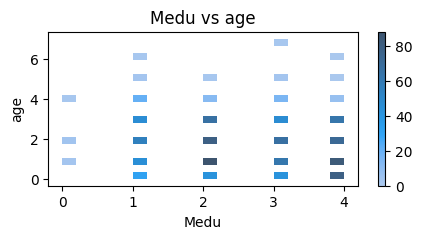

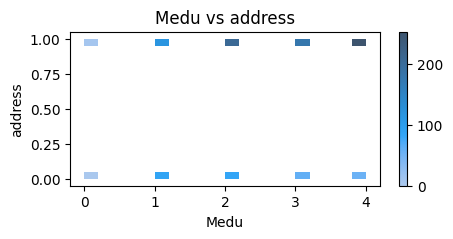

...

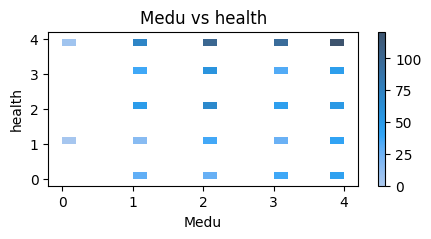

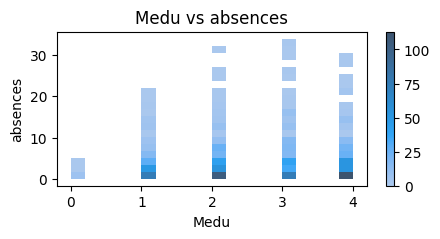

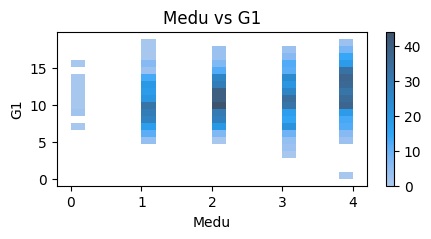

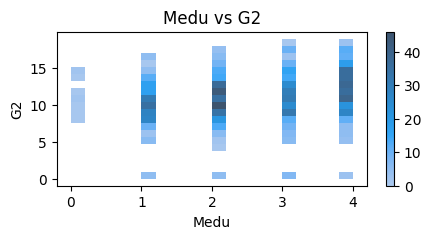

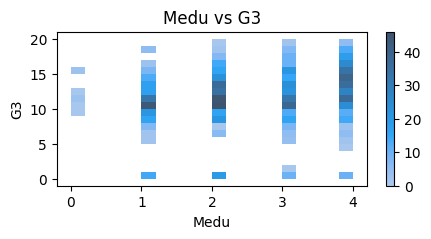

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


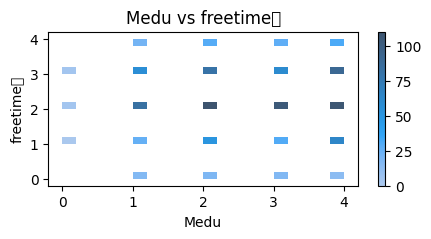

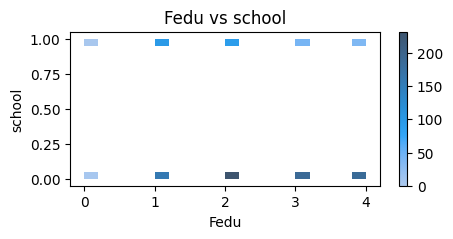

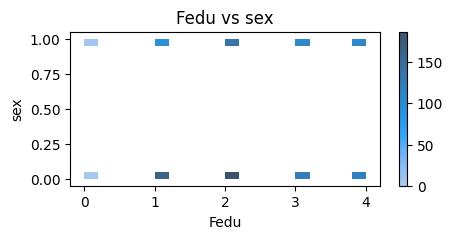

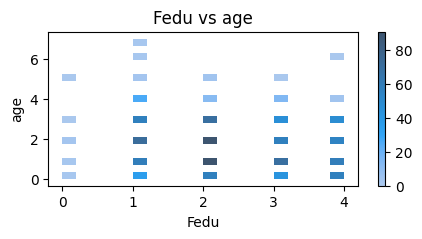

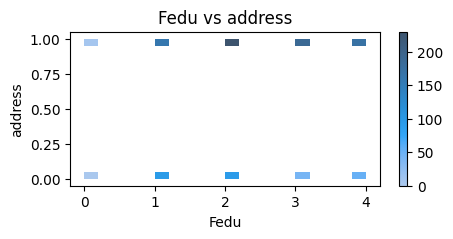

...

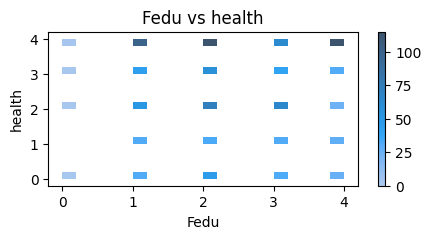

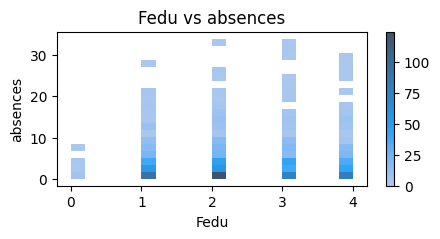

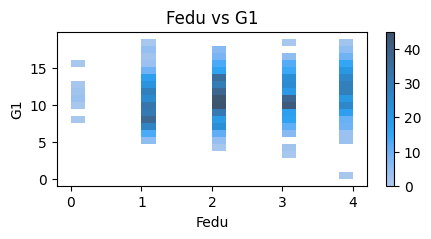

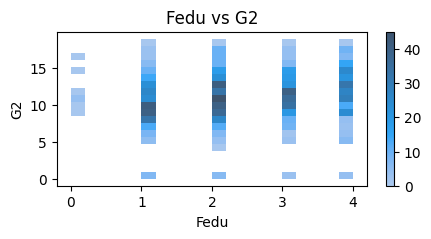

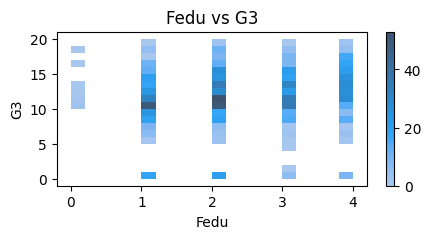

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


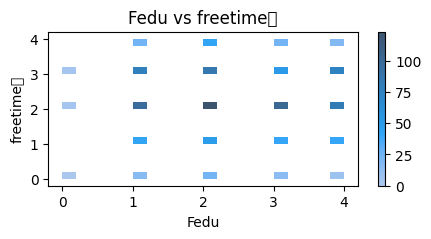

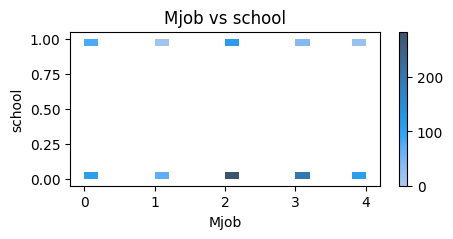

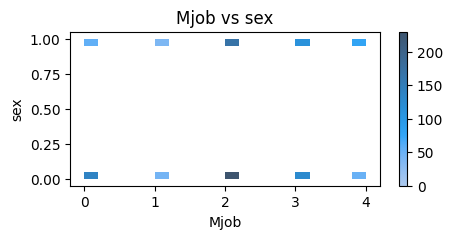

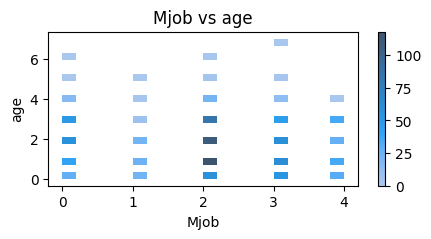

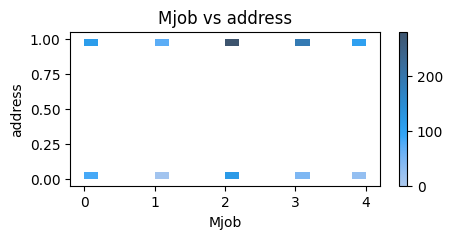

...

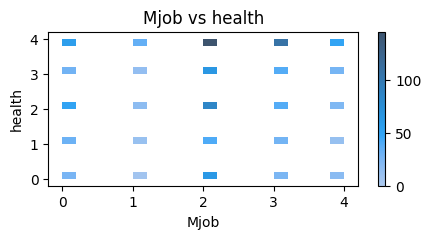

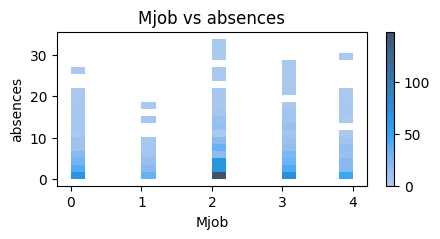

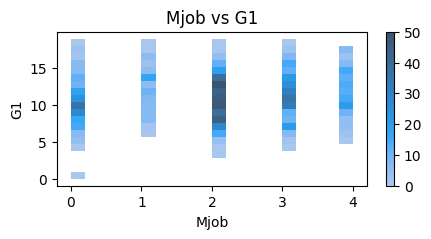

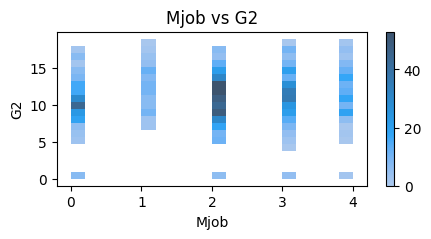

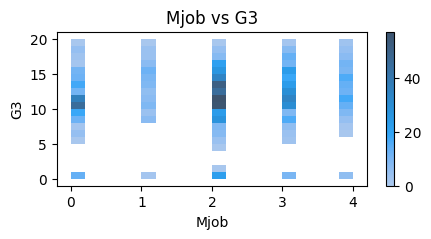

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


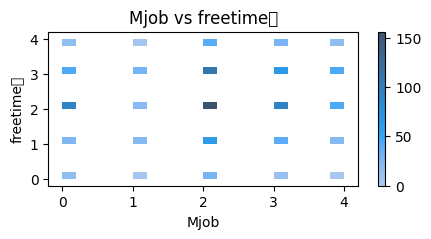

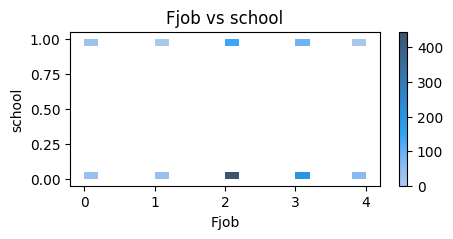

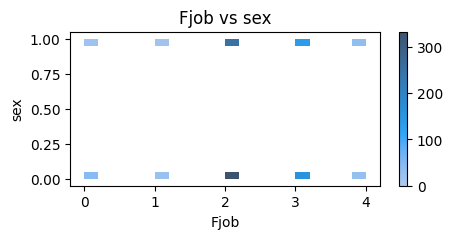

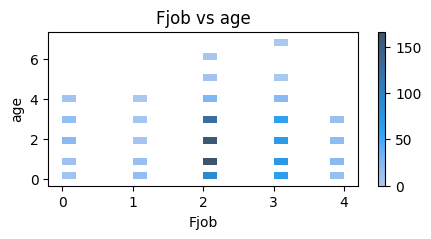

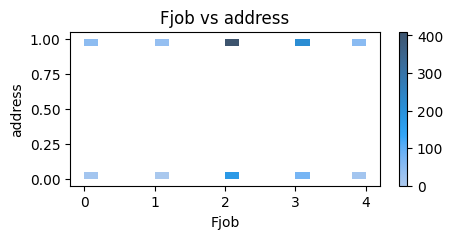

...

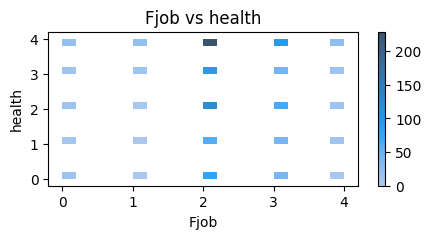

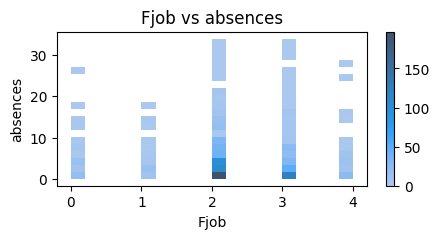

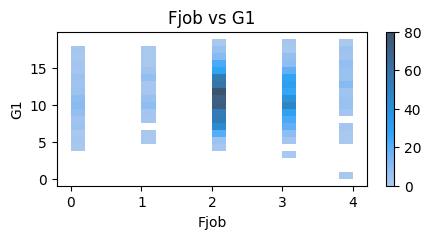

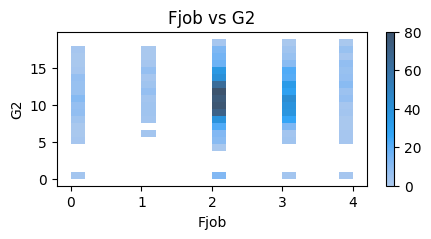

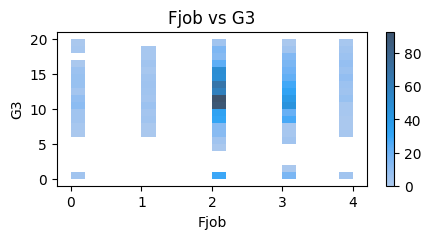

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


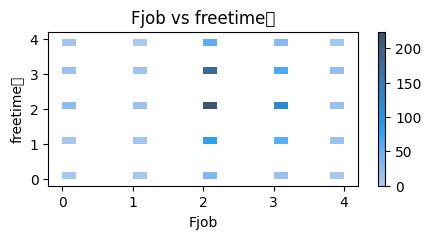

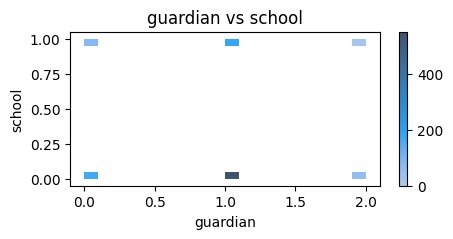

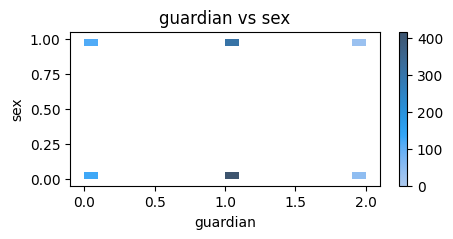

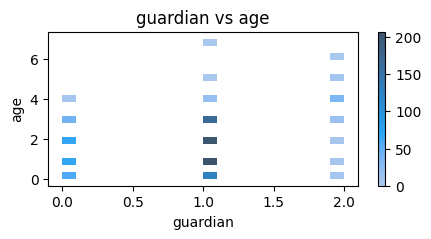

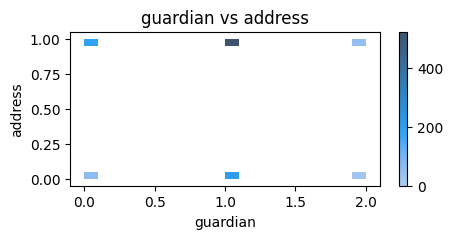

...

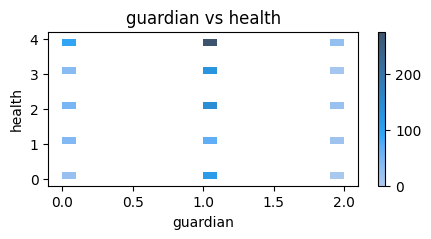

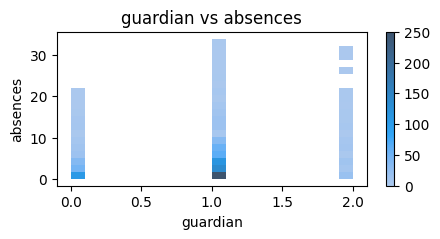

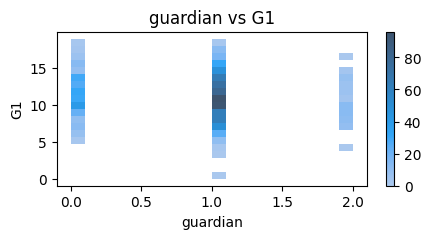

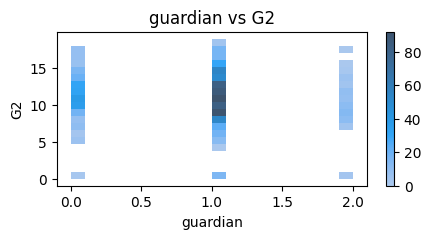

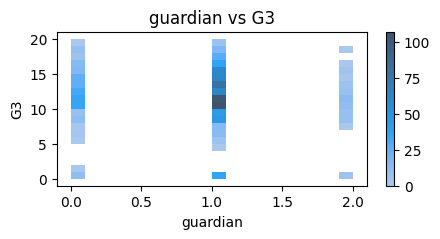

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


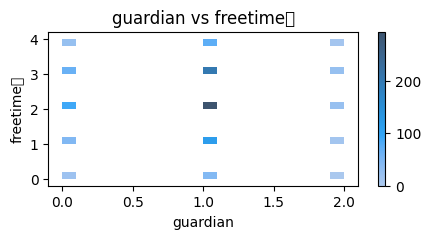

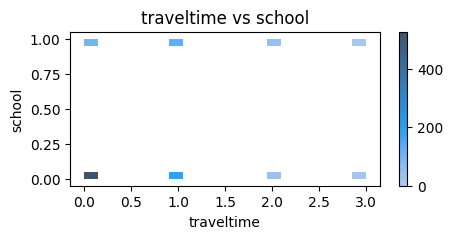

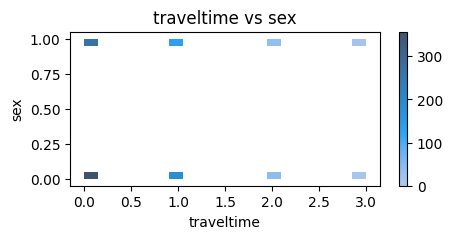

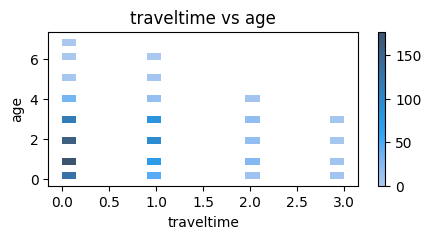

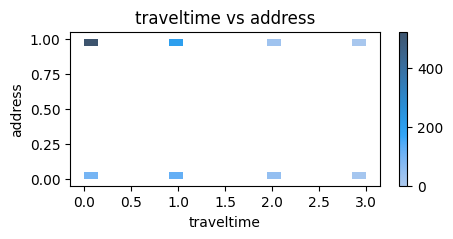

...

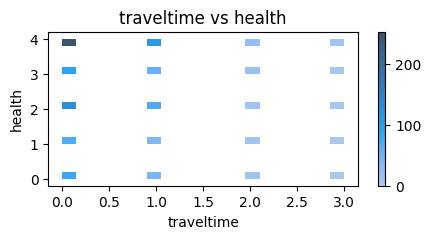

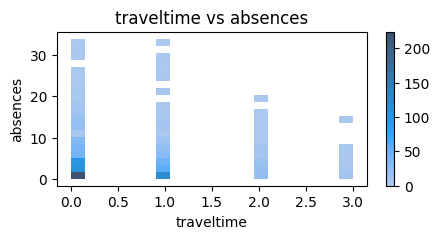

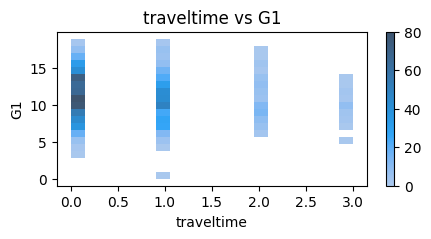

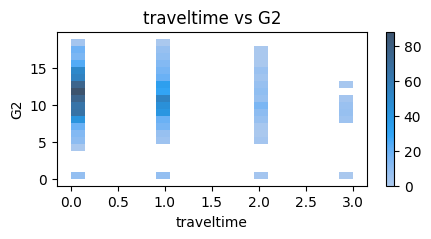

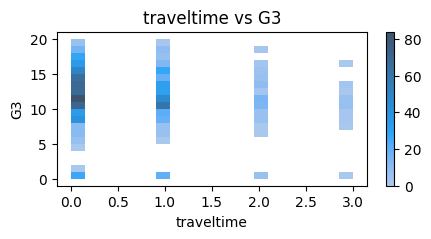

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


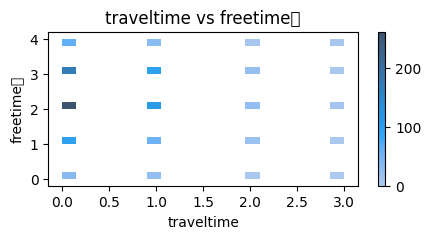

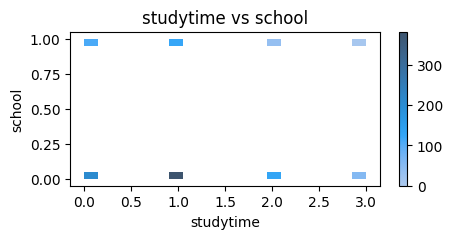

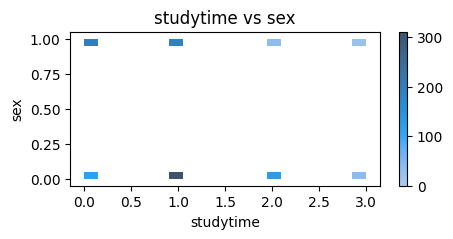

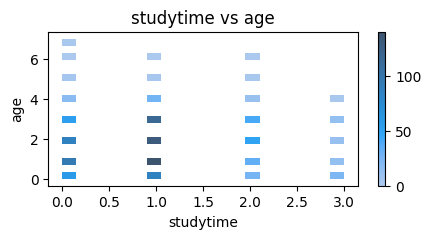

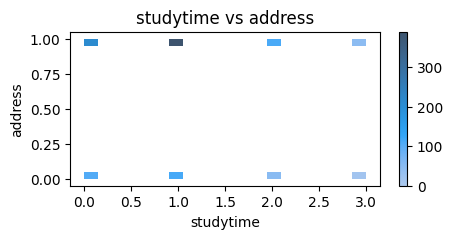

...

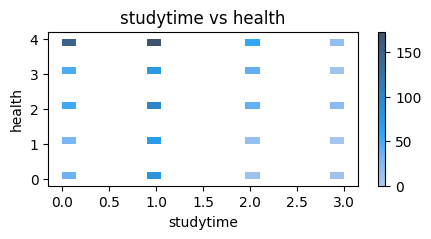

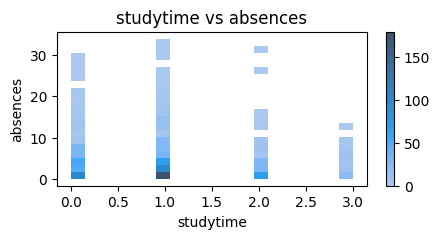

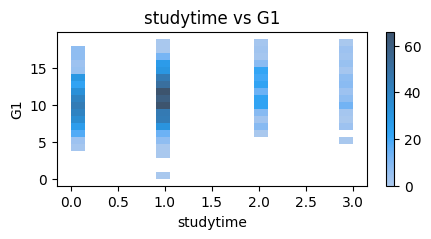

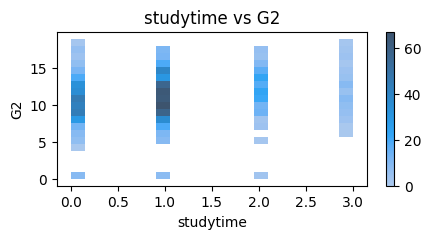

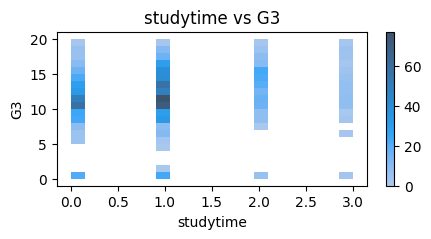

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


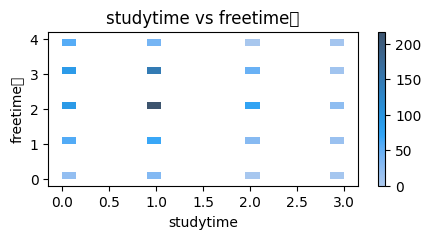

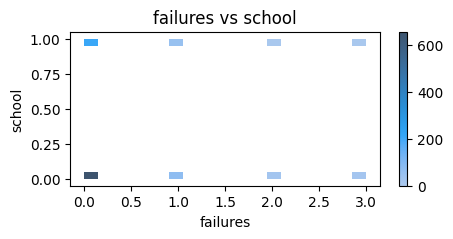

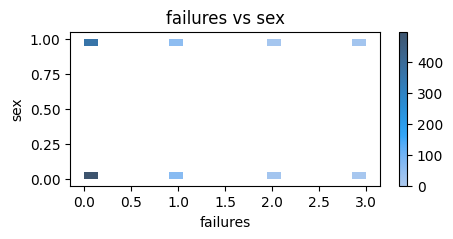

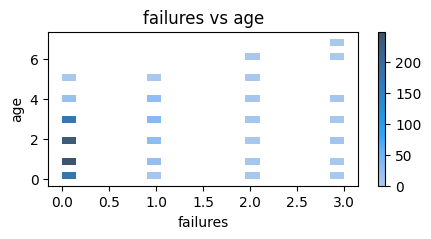

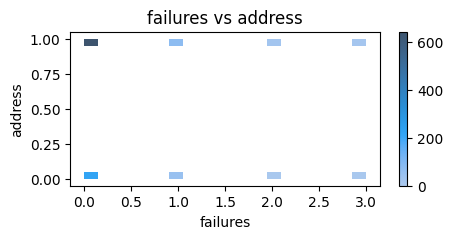

...

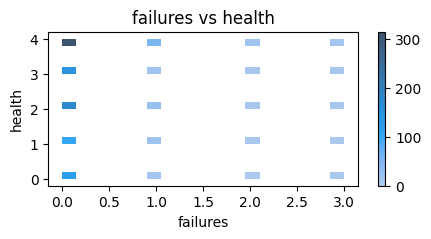

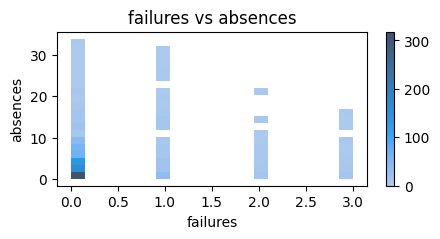

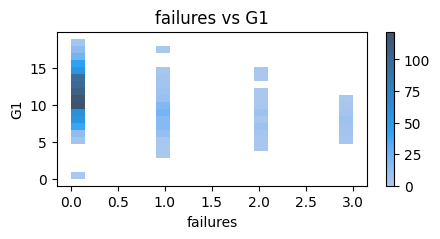

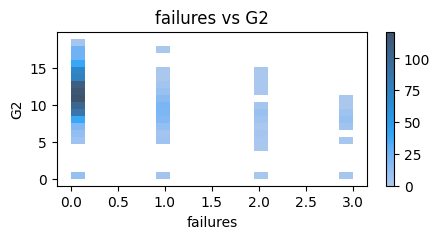

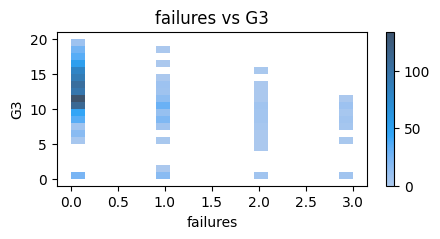

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


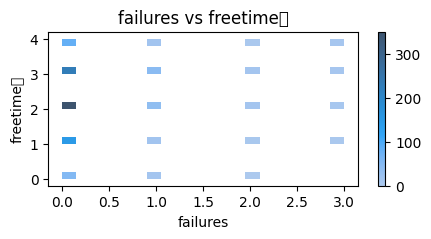

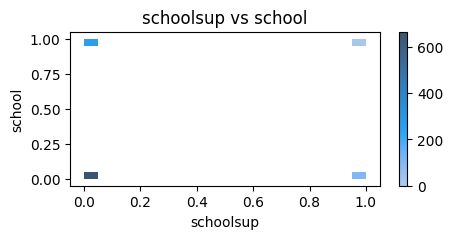

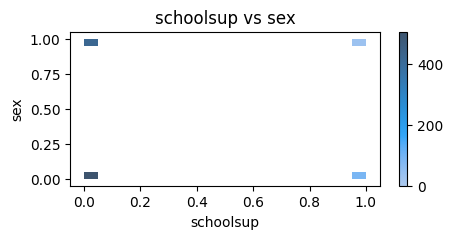

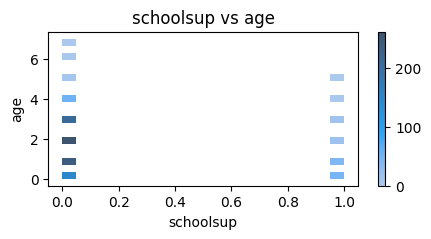

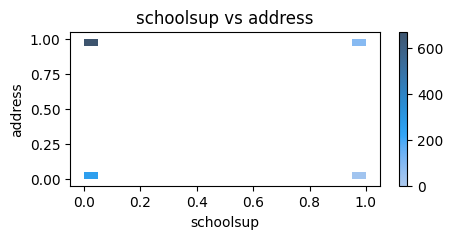

...

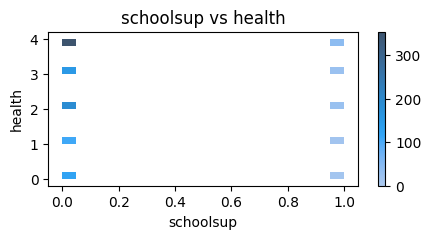

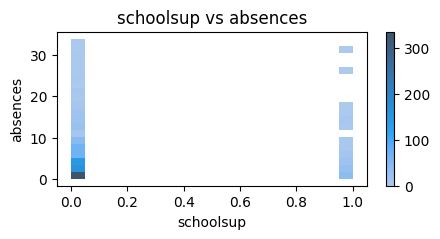

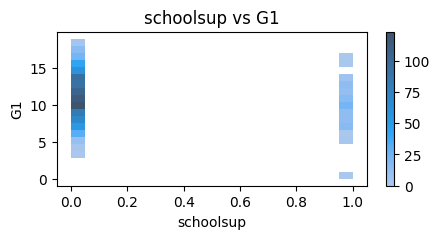

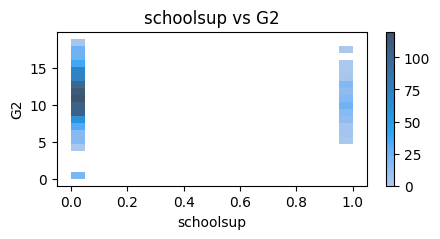

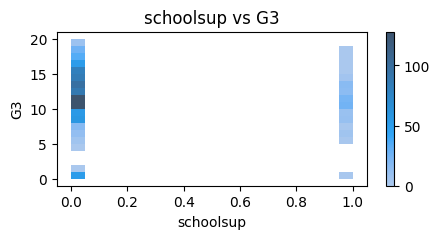

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


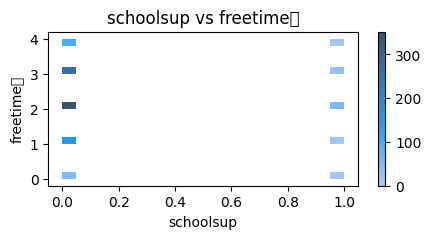

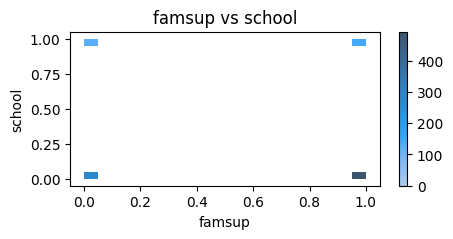

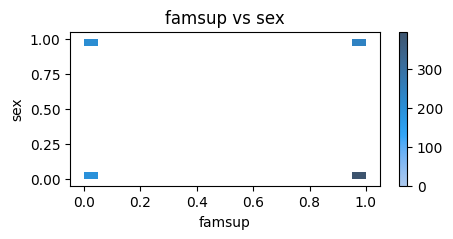

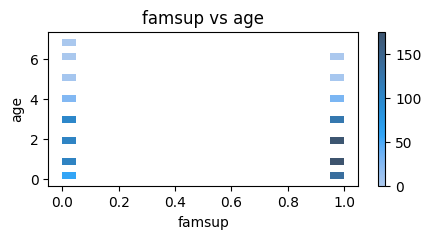

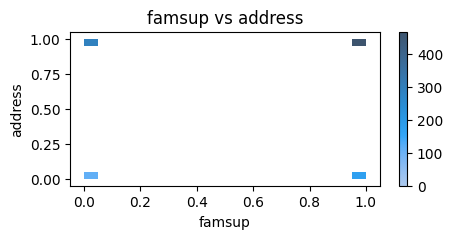

...

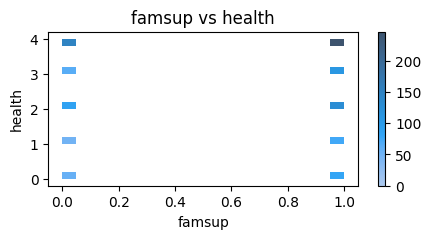

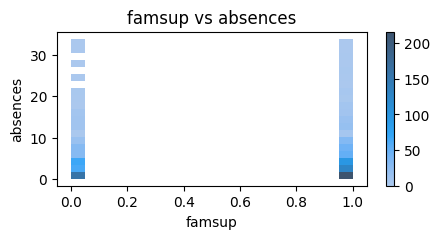

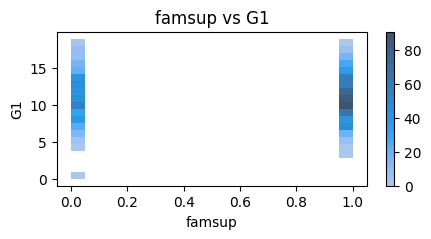

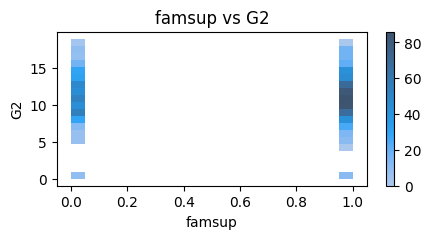

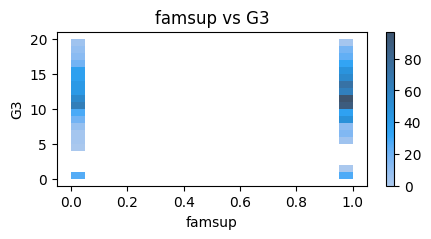

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


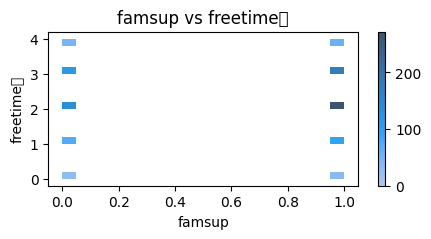

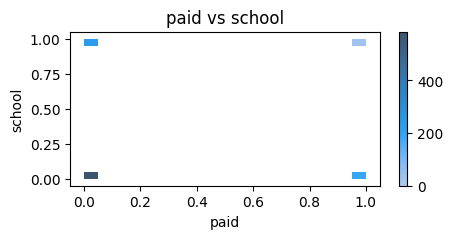

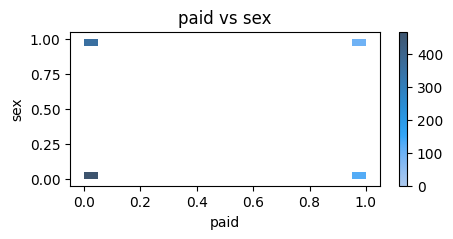

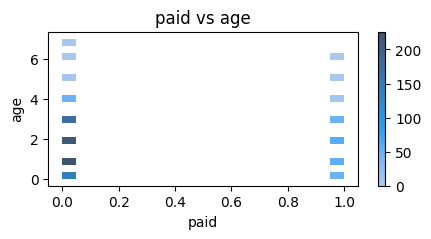

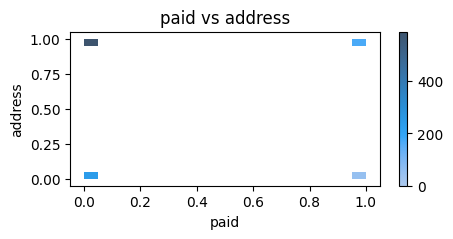

...

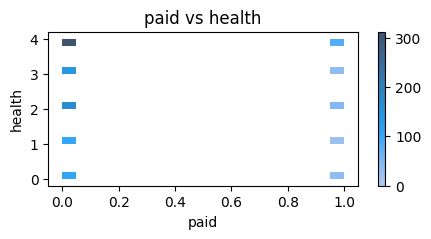

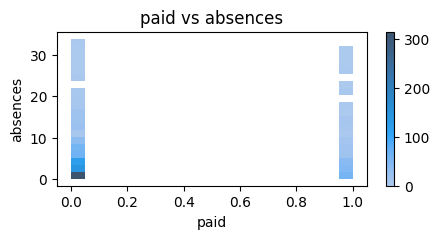

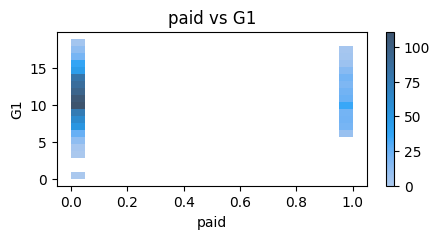

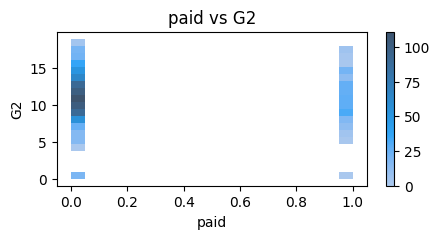

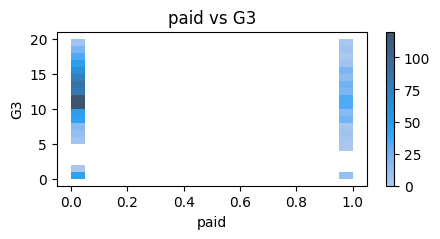

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


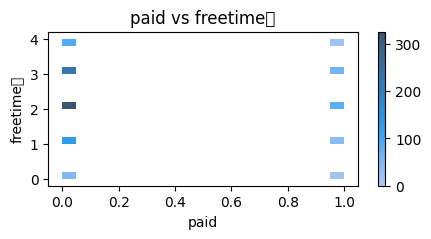

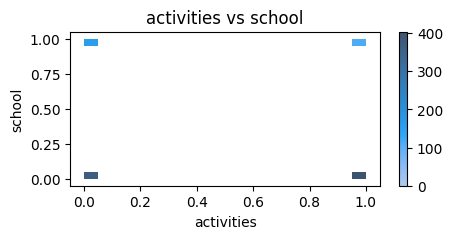

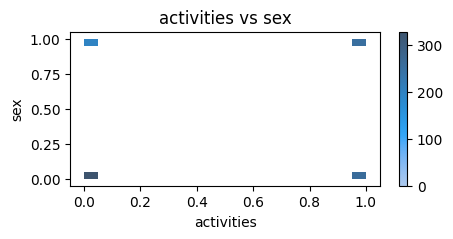

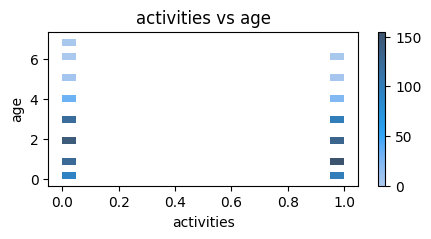

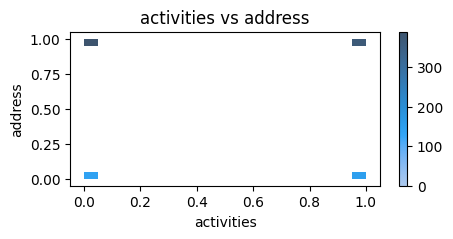

...

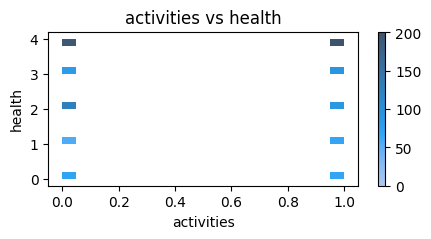

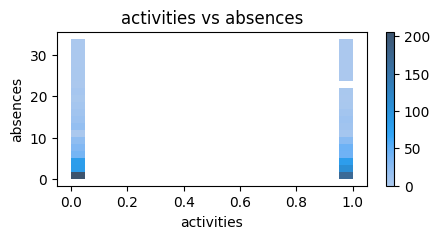

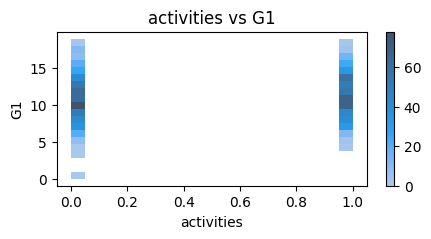

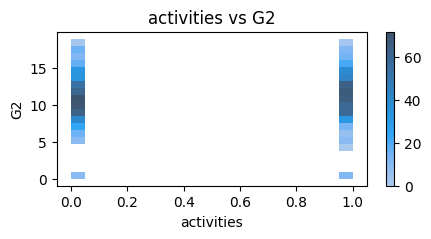

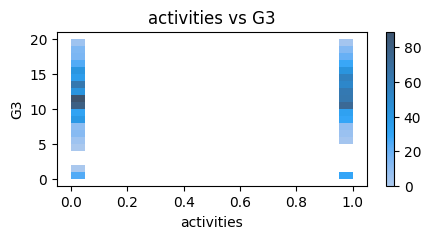

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


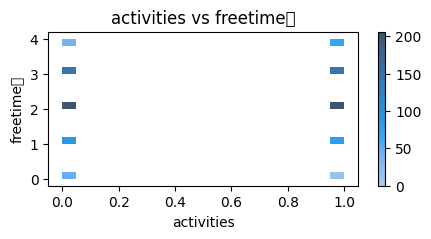

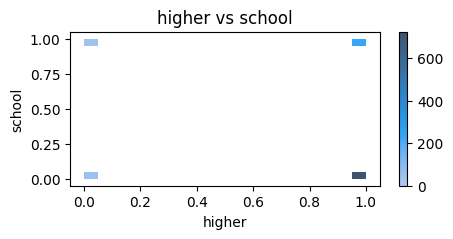

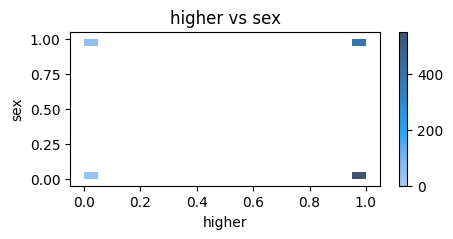

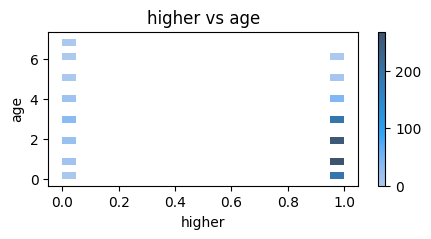

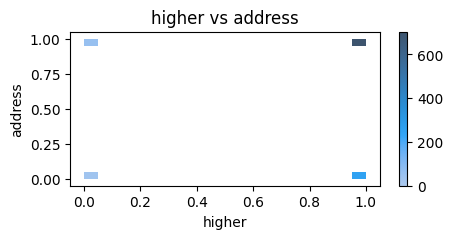

...

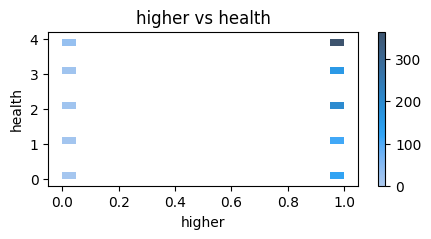

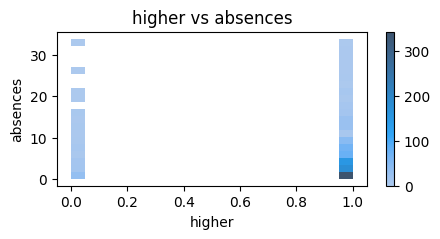

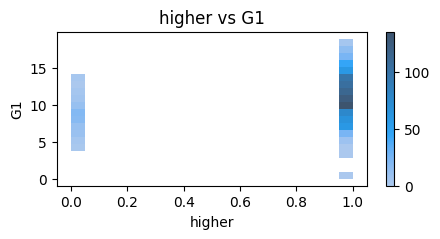

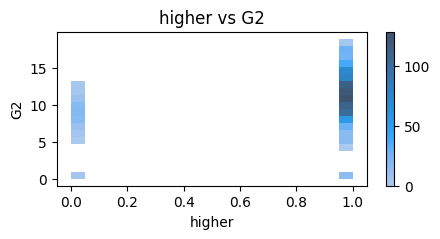

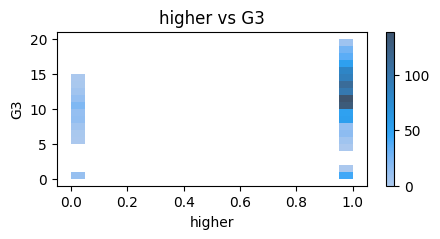

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


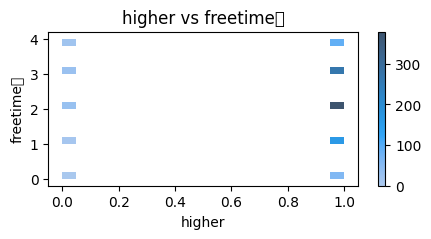

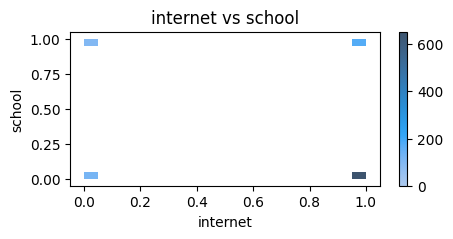

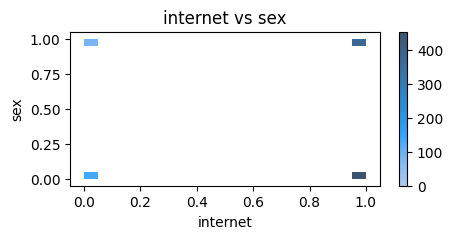

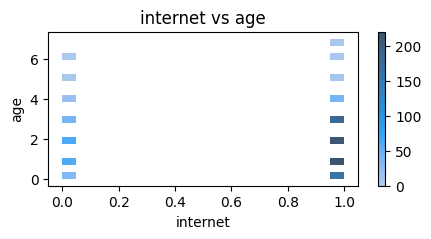

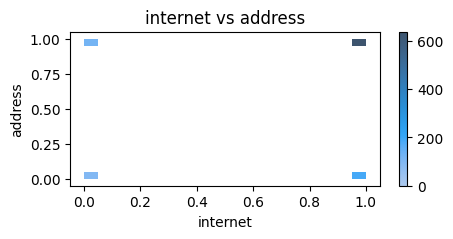

...

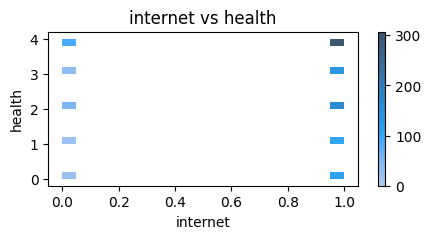

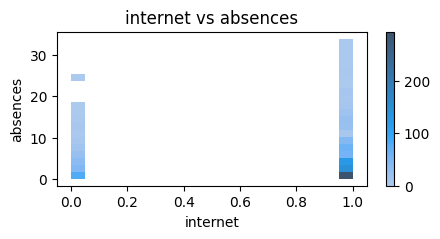

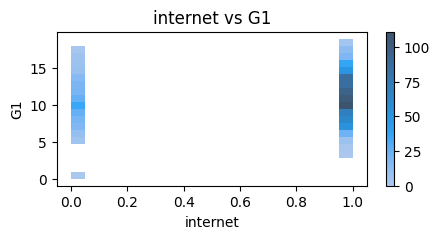

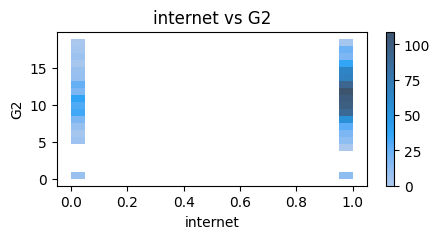

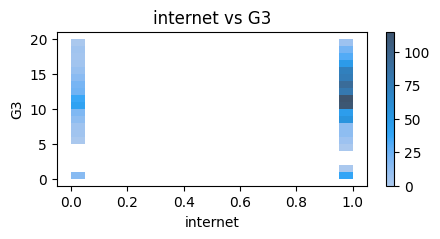

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


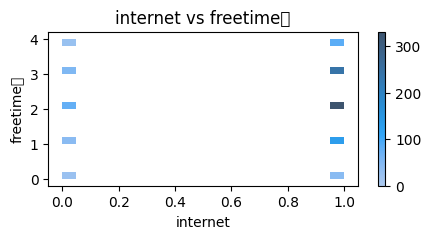

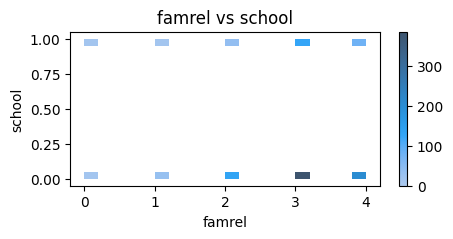

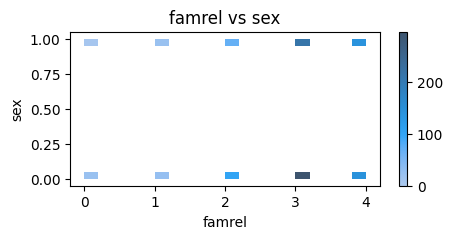

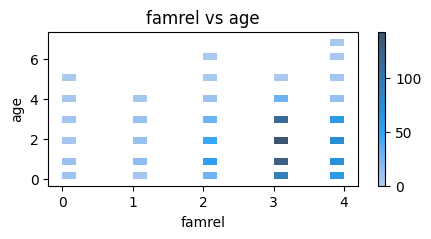

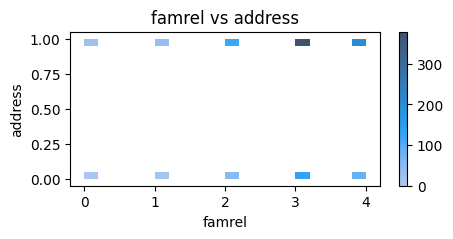

...

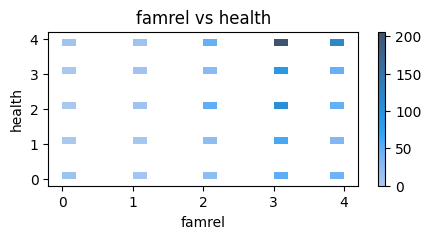

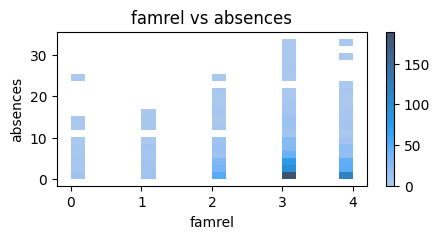

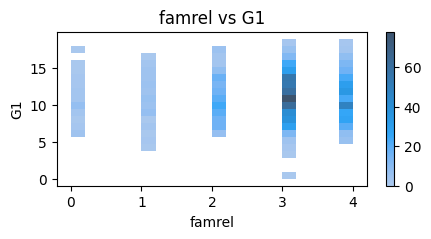

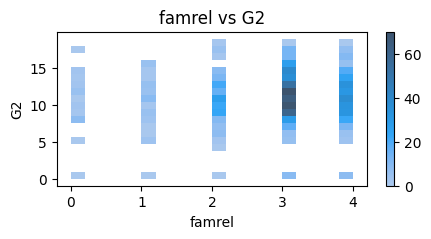

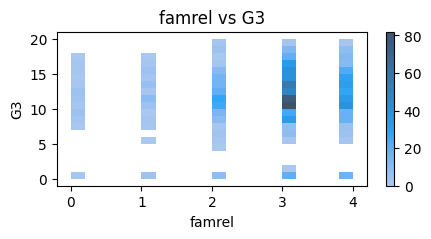

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


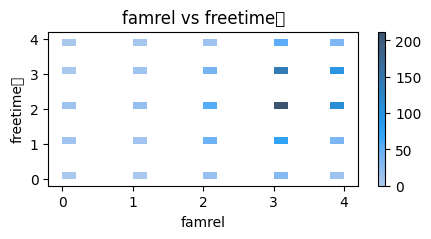

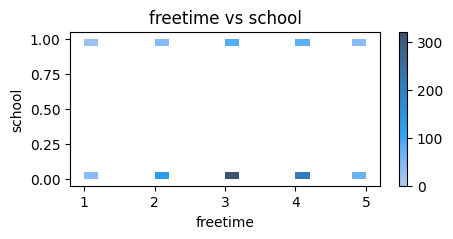

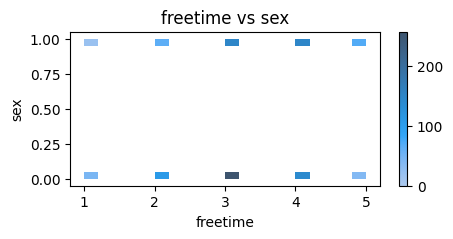

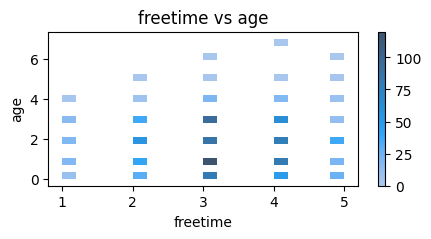

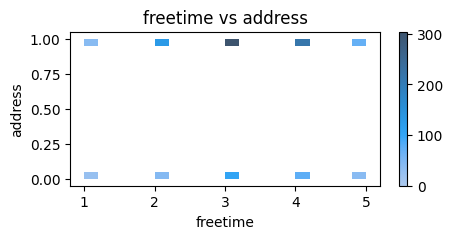

...

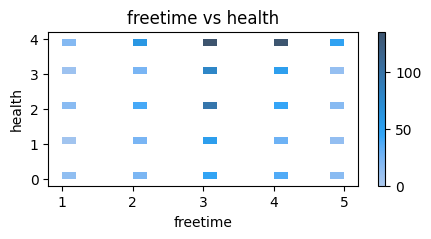

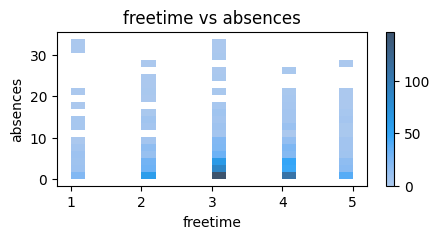

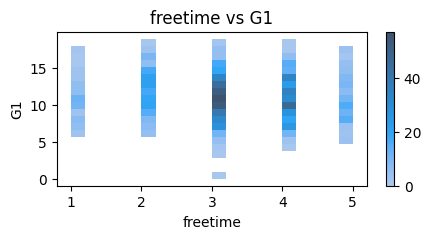

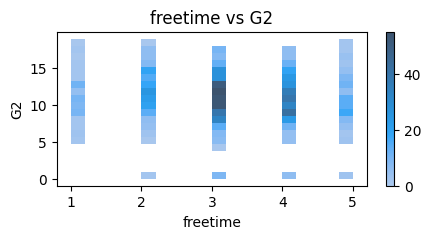

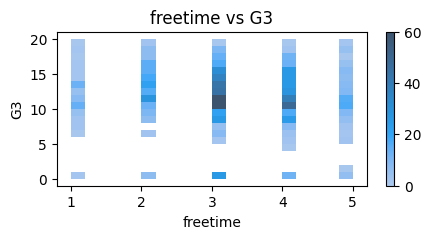

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


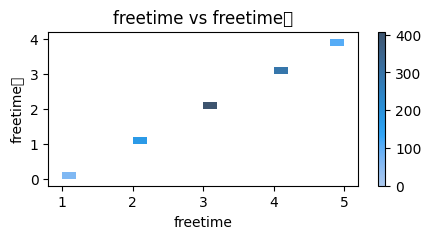

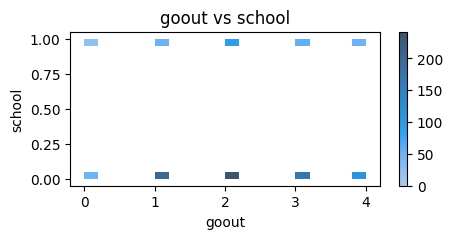

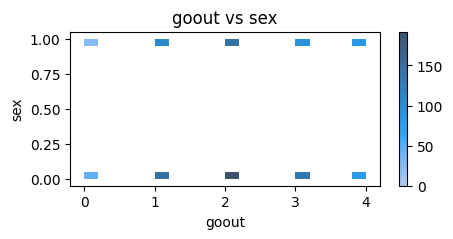

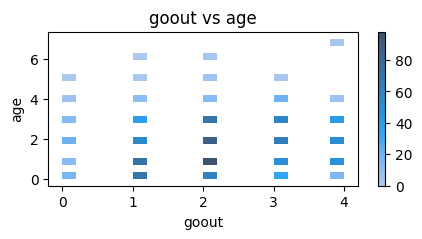

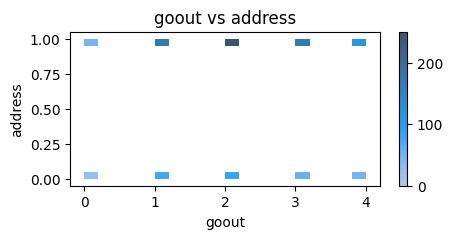

...

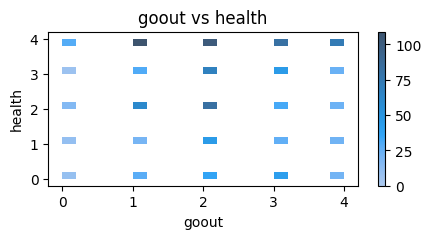

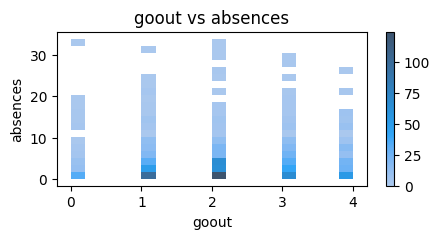

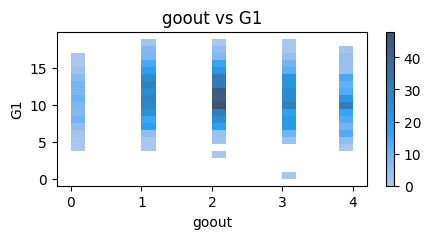

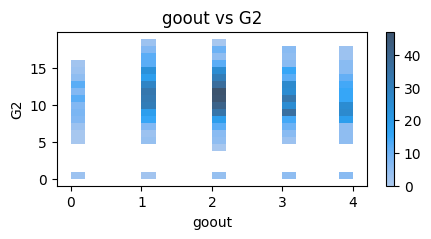

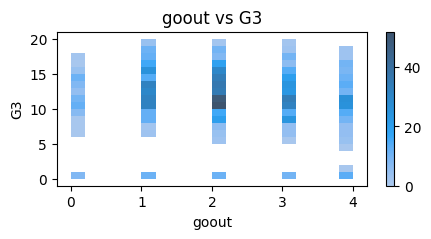

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


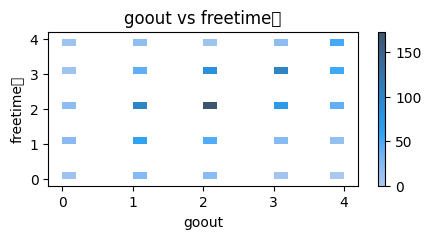

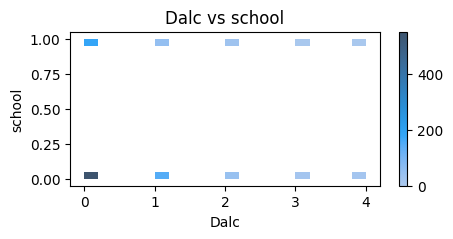

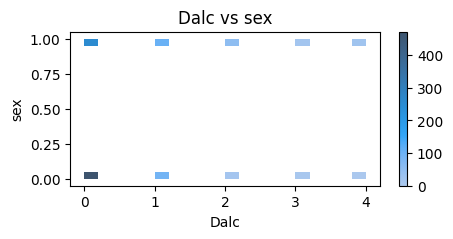

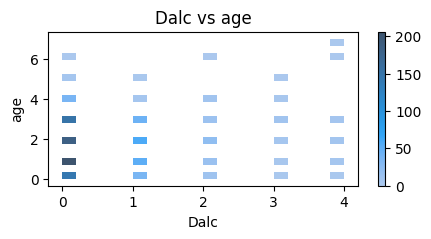

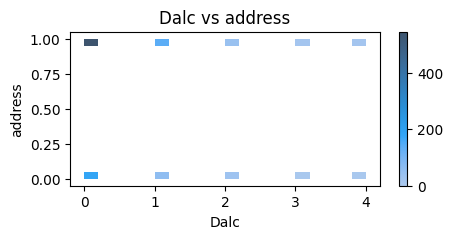

...

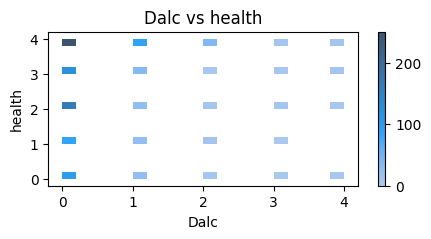

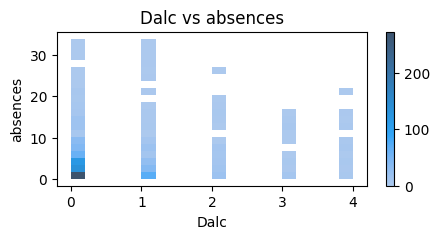

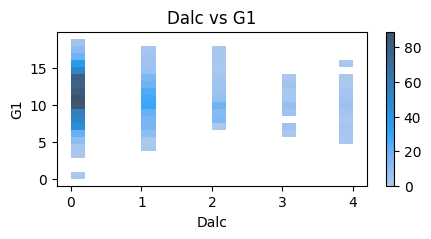

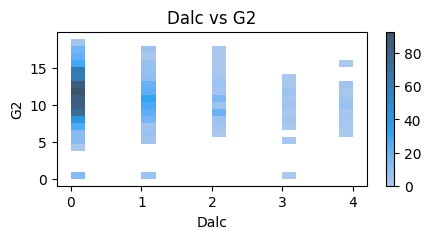

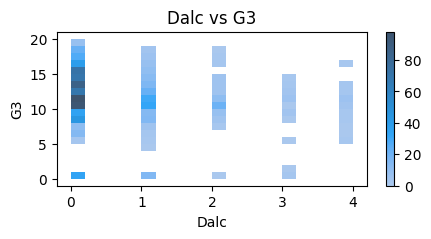

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


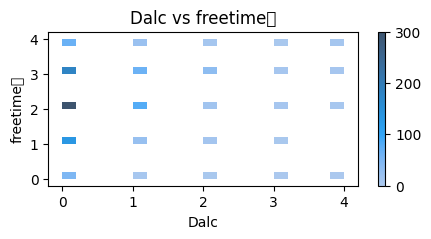

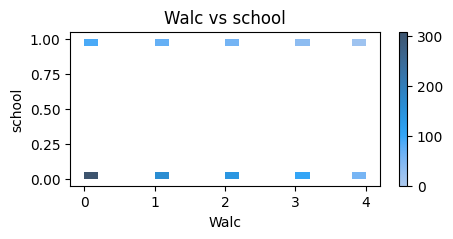

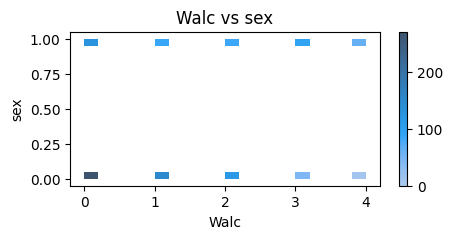

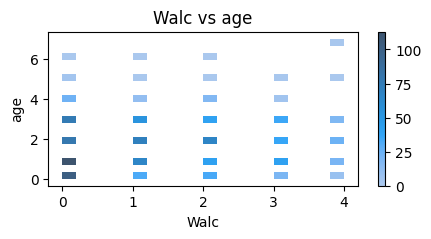

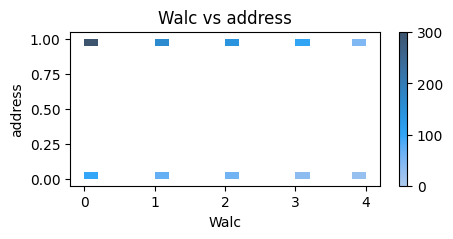

...

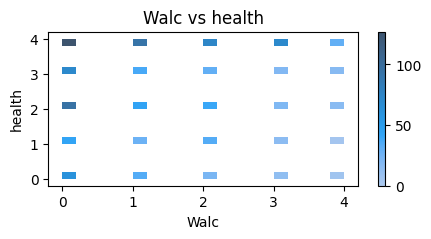

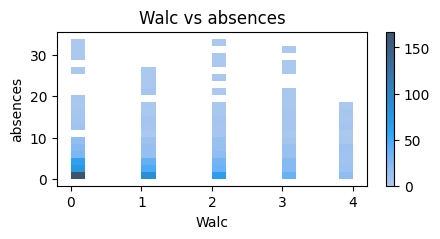

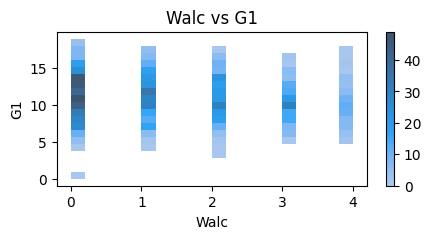

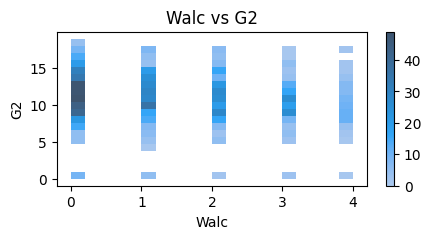

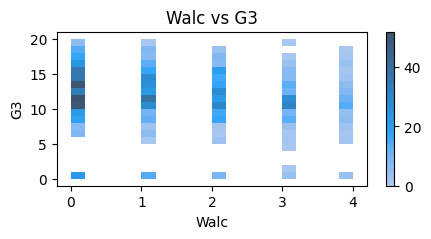

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


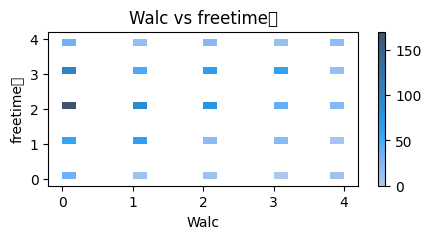

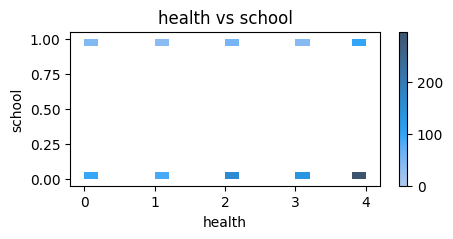

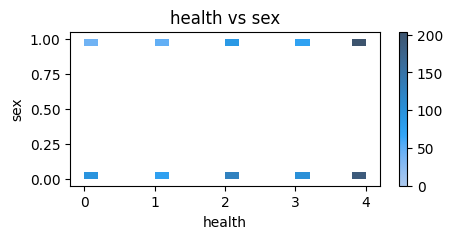

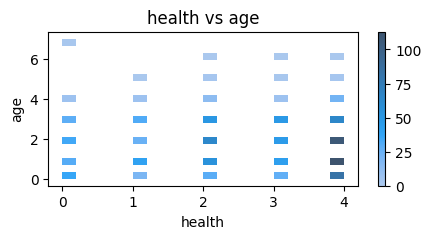

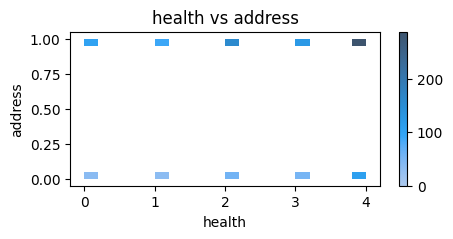

...

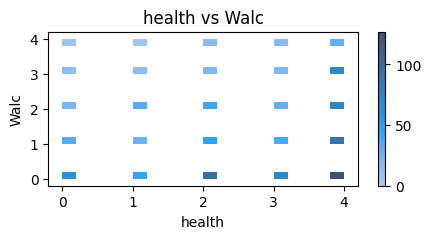

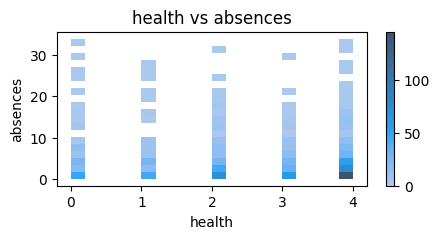

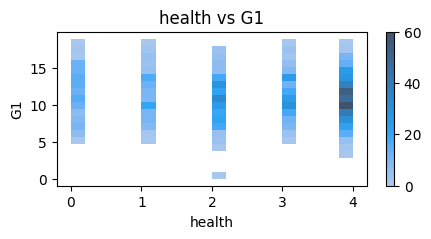

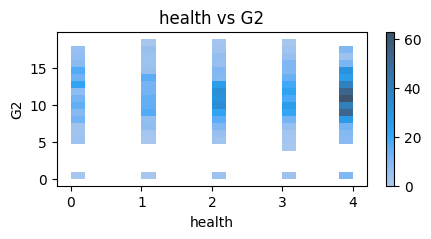

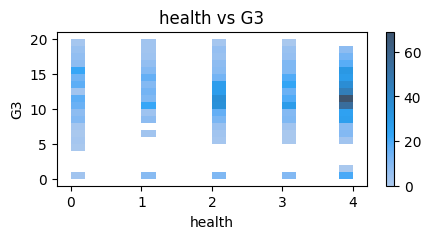

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


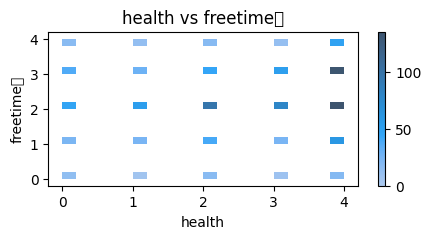

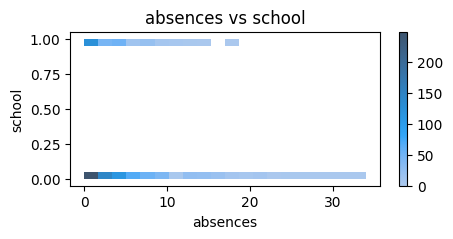

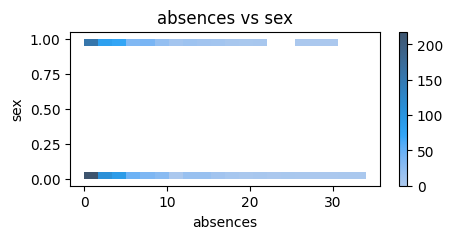

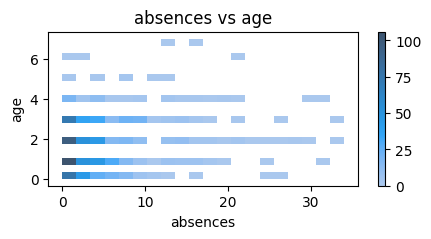

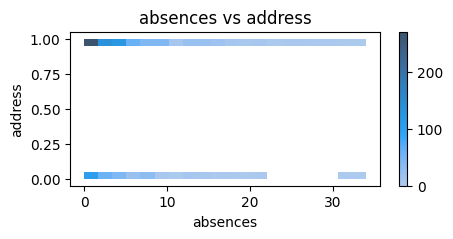

...

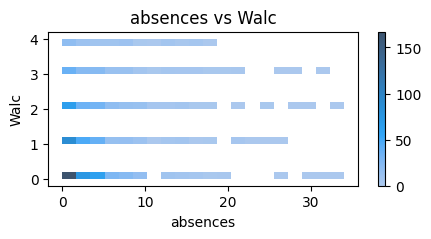

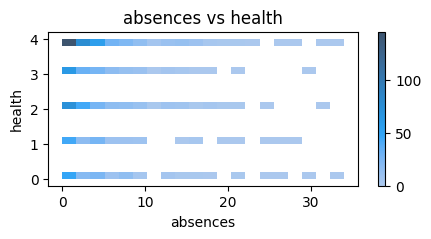

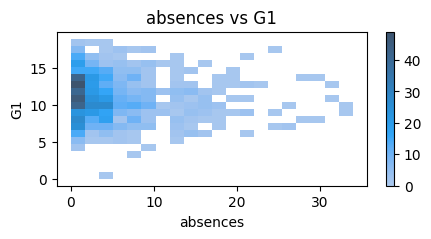

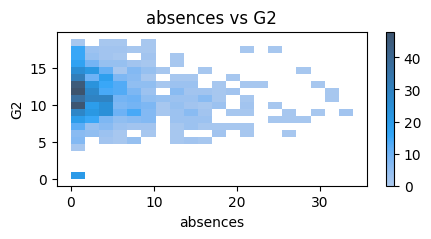

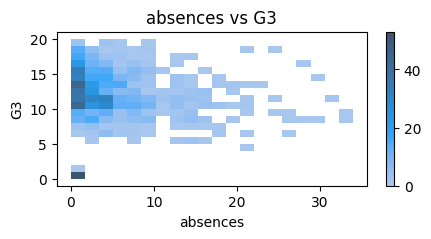

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


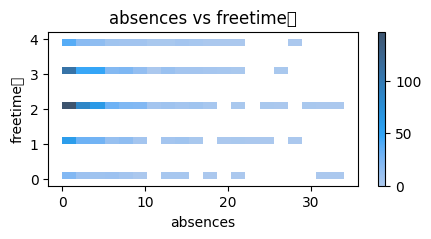

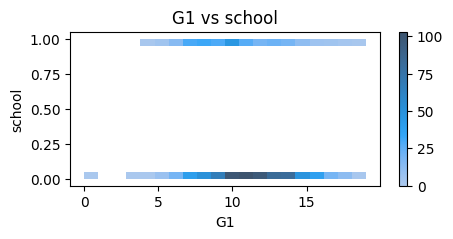

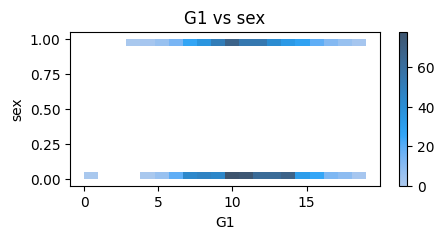

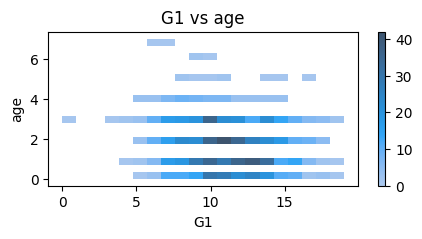

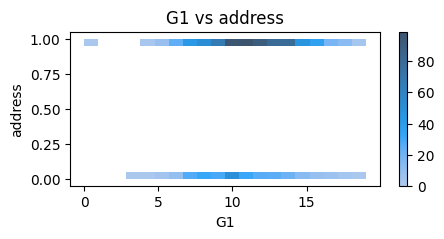

...

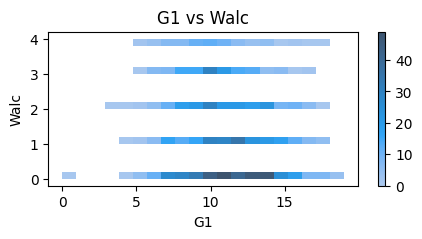

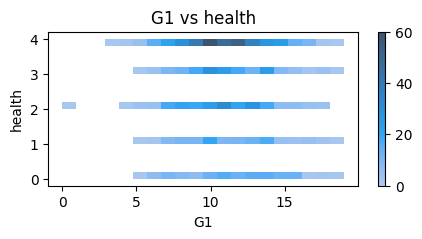

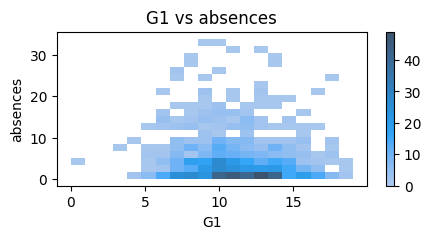

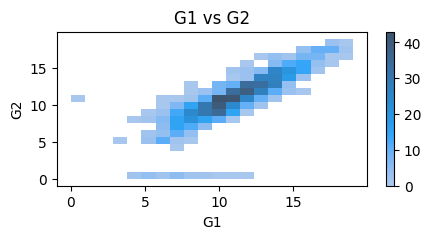

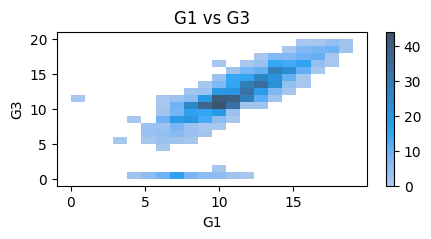

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


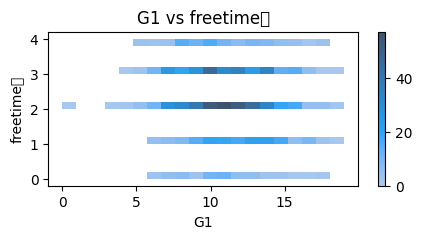

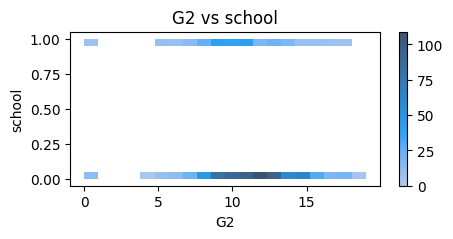

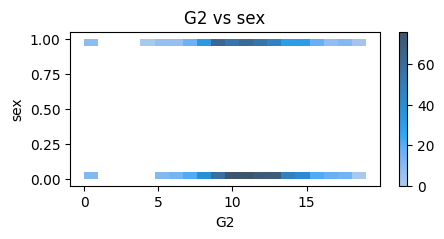

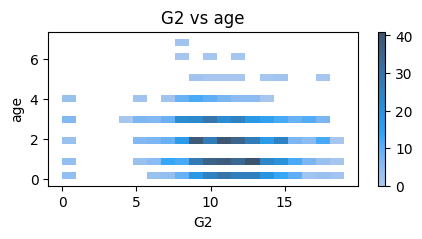

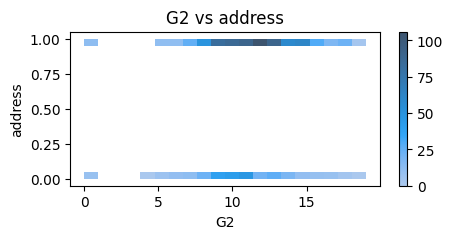

...

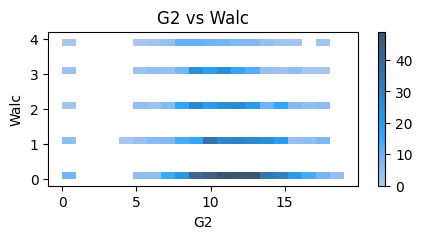

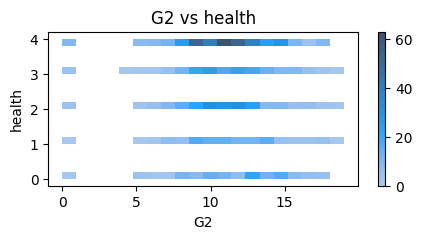

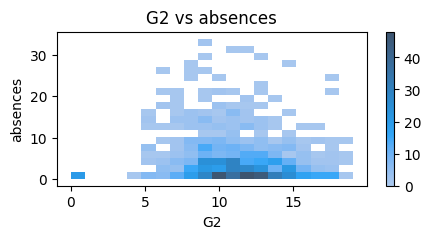

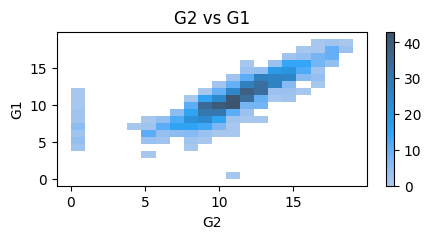

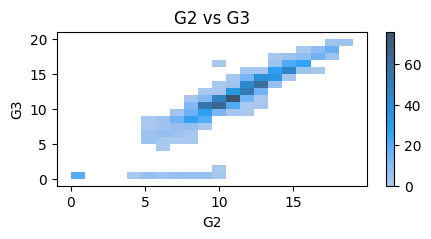

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


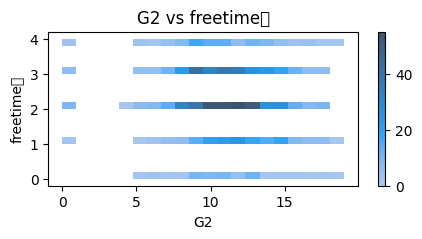

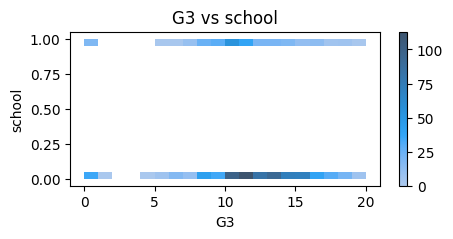

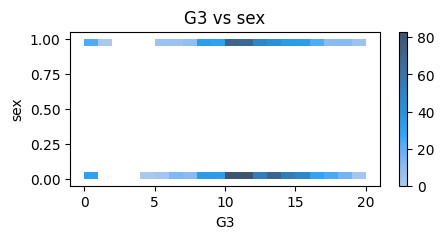

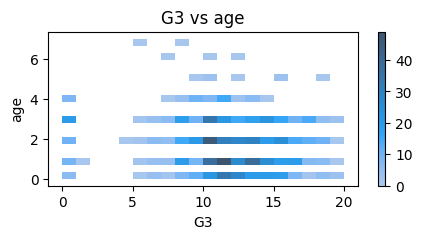

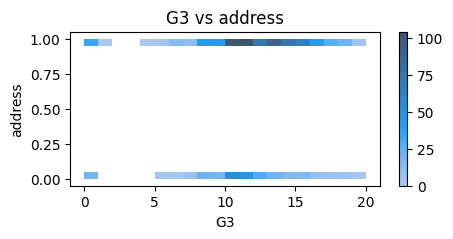

...

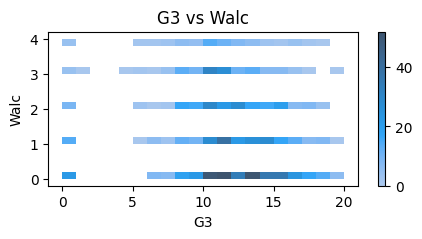

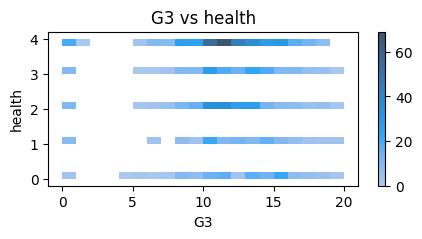

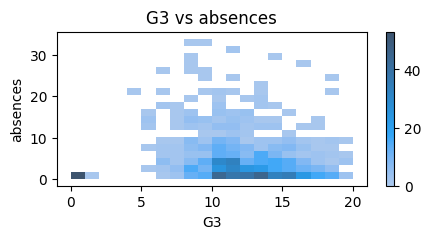

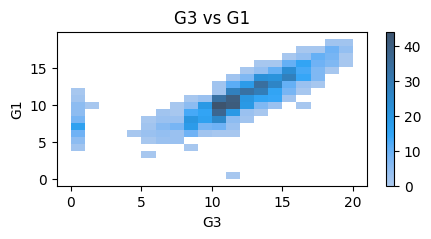

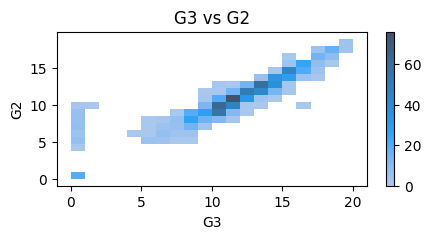

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


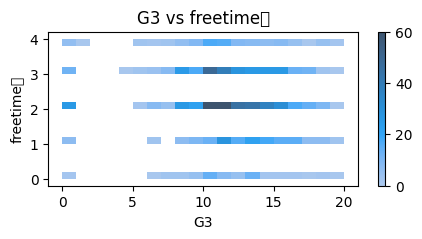

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


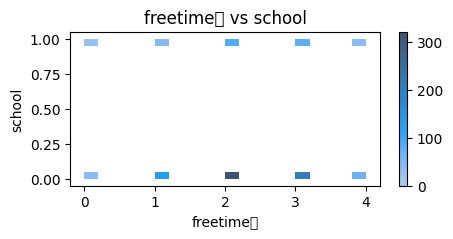

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


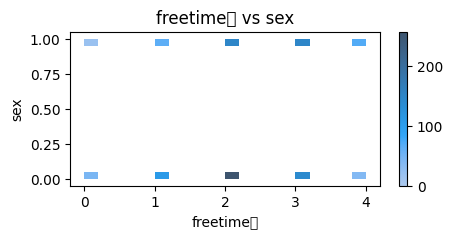

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


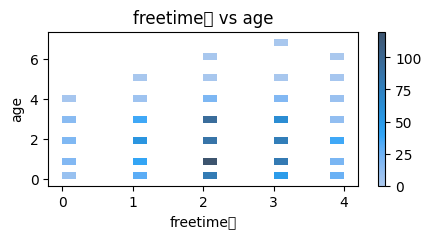

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


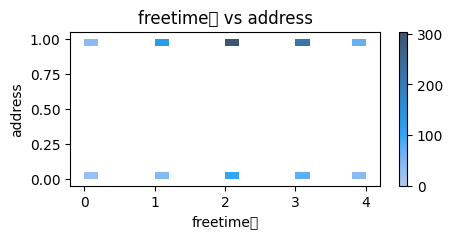

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


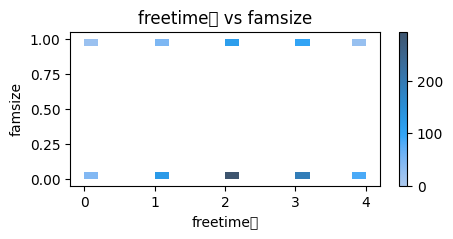

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


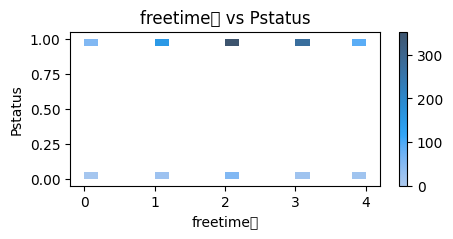

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


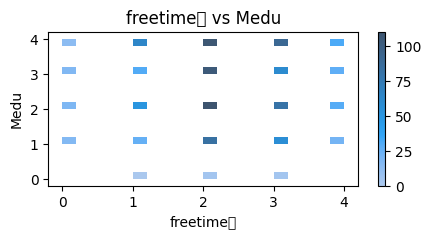

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


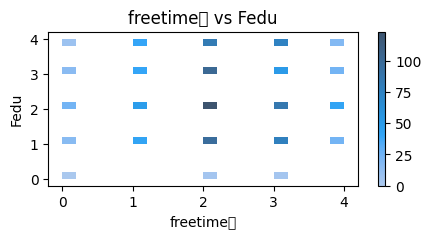

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


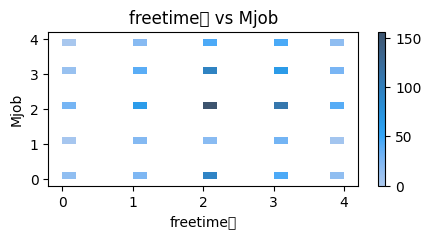

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


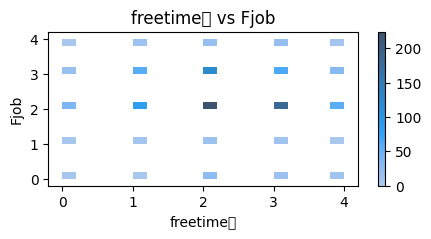

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


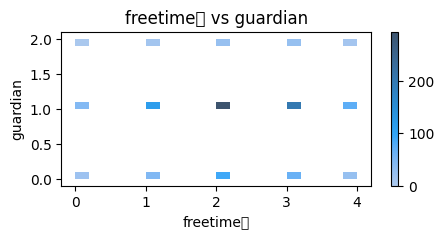

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


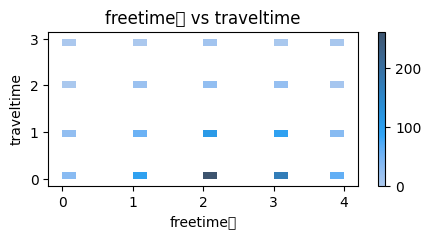

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


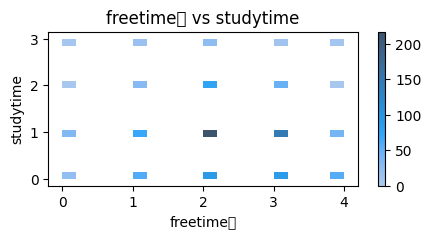

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


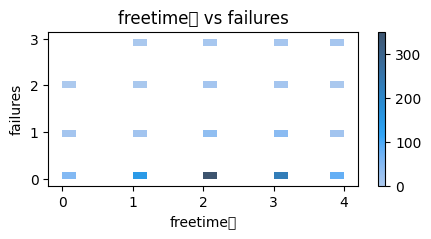

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


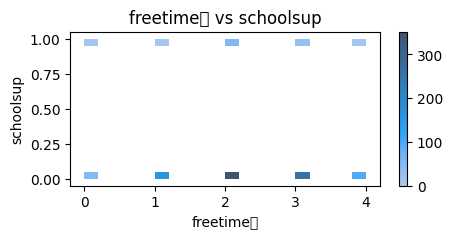

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


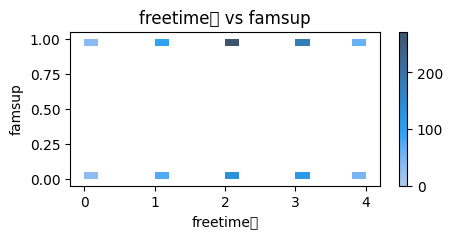

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


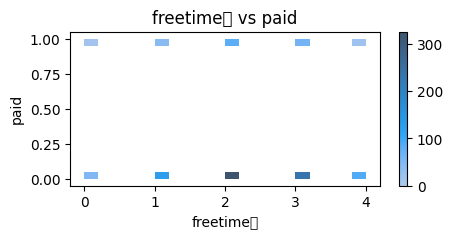

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


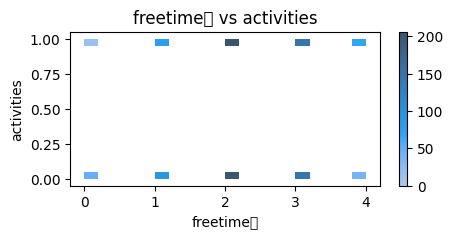

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


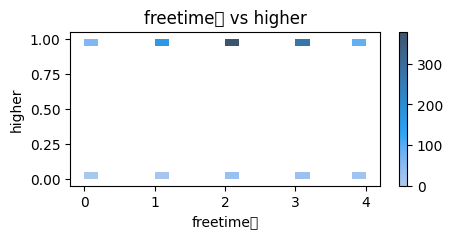

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


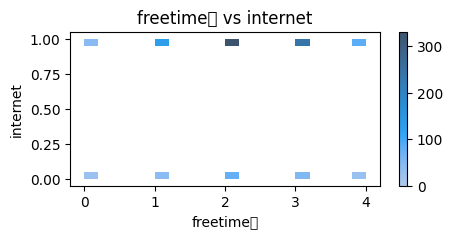

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


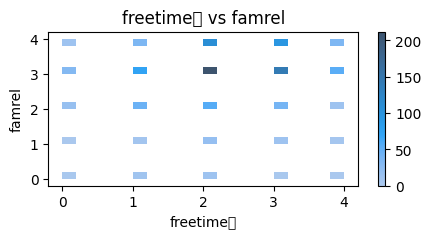

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


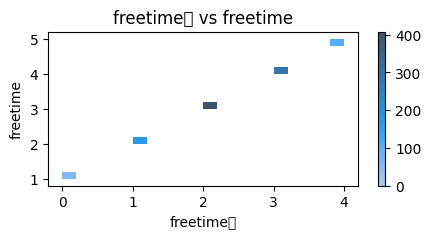

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


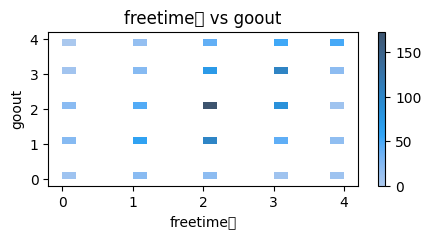

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


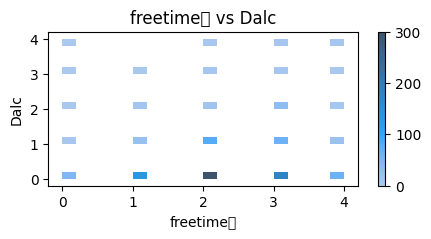

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


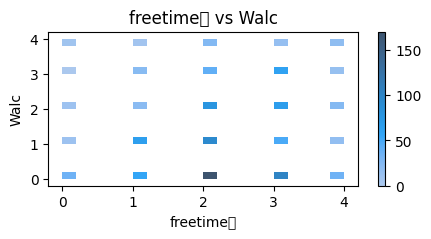

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


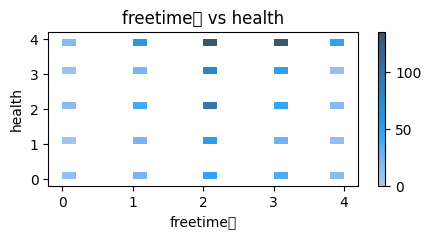

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


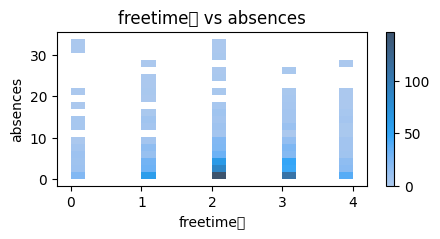

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


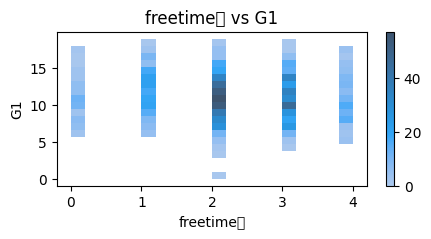

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


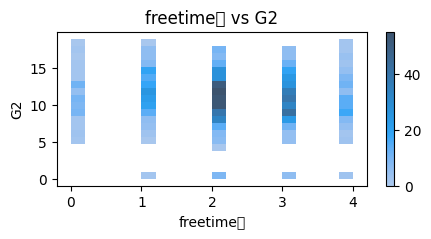

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


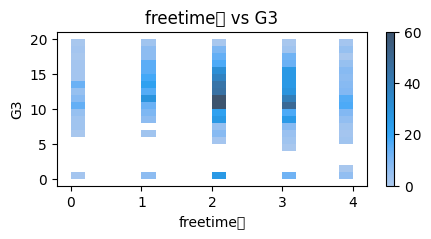

In [ ]:
for column1 in data.columns:
    for column2 in data.columns:
        if column1 == column2:
            continue
        plt.figure(figsize=(5, 2))
        sns.histplot(x=column1, y=column2, data=data, bins=20, cbar=True)
        plt.title(f'{column1} vs {column2}')
        plt.xlabel(column1)
        plt.ylabel(column2)
        plt.show()


<h2 style = "color:red">Univariate Exploration</h2>
using heatmap (correlation)

C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\seaborn\utils.py:61: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.draw()
C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


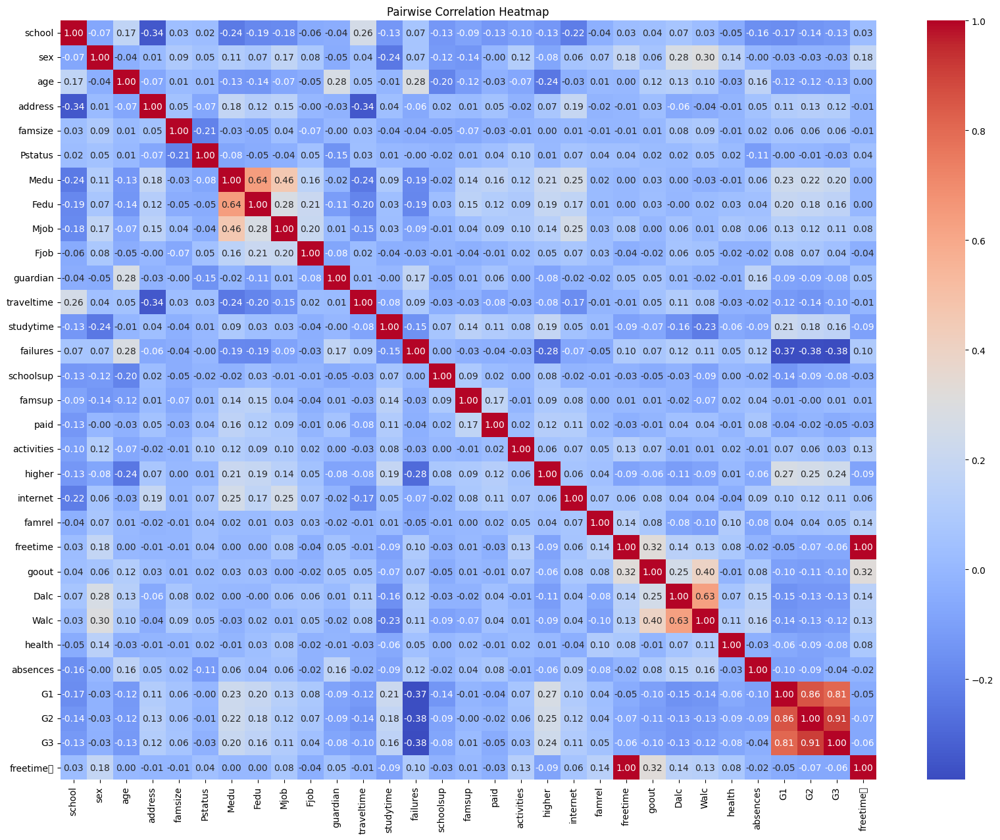

In [ ]:
corr_matrix = data.corr()
plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Pairwise Correlation Heatmap")
plt.show()



<h2 style = "color:red">Feature normalization</h2>
1- check again for binary value (0 & 1) -> (min & max) not (mean)<br><br>
2- convert value for each colmns to range from 0 to 1<br><br>
3- Feature normalization enhances model performance by ensuring that each feature contributes equally to distance calculations, reduces sensitivity to varying feature scales, and facilitates easier comparisons of feature importance and model interpretation.<br><br>
4- take sample(5) to check


In [ ]:
binary_data = data.select_dtypes(include='int64')

scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(binary_data)
normalized_df = pd.DataFrame(normalized_data, columns=binary_data.columns)

print(normalized_df.sample(5))




          age  Medu  Fedu  traveltime  studytime  failures  famrel  freetime  \
335  0.428571  0.25  0.25    0.333333   0.333333  0.000000    1.00      0.75   
602  0.142857  0.50  0.50    0.333333   0.000000  0.666667    0.25      0.50   
372  0.428571  1.00  1.00    0.000000   0.333333  0.333333    0.25      0.75   
307  0.285714  0.50  1.00    0.000000   0.333333  0.000000    0.75      0.50   
452  0.000000  0.75  1.00    0.000000   0.000000  0.000000    1.00      1.00   

     goout  Dalc  Walc  health  absences        G1        G2    G3  freetime\t  
335   0.75  0.00  0.00    0.75  0.000000  0.631579  0.684211  0.65        0.75  
602   0.50  0.25  0.25    0.25  0.235294  0.473684  0.473684  0.45        0.50  
372   0.75  0.00  0.00    0.75  0.058824  0.736842  0.631579  0.65        0.75  
307   0.25  0.00  0.00    1.00  0.000000  0.736842  0.789474  0.75        0.50  
452   1.00  0.50  0.25    1.00  0.058824  0.473684  0.473684  0.45        1.00  


<h2 style = "color:red">K-Fold utilization</h2>
1- Underfitting is found when the cross-validation scores are uniformly low<br><br>
2- while overfitting is detected when the scores vary.<br><br>
3- use it to check between train and test for model (overfitting)<br><br>
4- we use knn to Compare output with k-fold


In [ ]:
model = KNN()

x= data.drop("G3" , axis= 1)
y= data["G3"]
x_train , x_test , y_train , y_test = train_test_split(x , y )

kf = KFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(model, x_train, y_train, cv=kf, scoring='neg_mean_squared_error')
print(f'Cross-Validation loss Scores: {scores}')
print(f'Mean CV loss: {scores.mean()}')

model.fit(x_train , y_train)
p = model.predict(x_test)
print(mean_squared_error(y_test, p))



Cross-Validation loss Scores: [-4.37579618 -3.82802548 -5.93630573 -5.31410256 -4.62820513]
Mean CV loss: -4.816487016168545
5.662835249042145


<h2 style = "color:red">Regularization test</h2>
It is used to know which columns are influential or not, which helps improve the model when deleting them

In [ ]:
def APPLY_REGULARIZATION(reg):
    reg.fit(x_train, y_train)
    print("Best alpha using built-in {}: %f".format(str(reg).split('.')[-1]) % reg.alpha_)
    print("Best score using built-in {}: %f".format(str(reg).split('.')[-1]) %reg.score(x_train,y_train))
    coef = pd.Series(reg.coef_, index = x_train.columns)
    print("{} picked ".format(str(reg).split('.')[-1]) + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
    imp_coef = coef.sort_values()
    print(imp_coef)
APPLY_REGULARIZATION(ElasticNetCV())  
APPLY_REGULARIZATION(LassoCV()) 

Best alpha using built-in ElasticNetCV(): 0.205383
Best score using built-in ElasticNetCV(): 0.860881
ElasticNetCV() picked 3 variables and eliminated the other 27 variables
school        0.000000
health       -0.000000
Walc         -0.000000
Dalc          0.000000
goout        -0.000000
freetime     -0.000000
famrel        0.000000
internet     -0.000000
higher        0.000000
activities   -0.000000
paid         -0.000000
famsup       -0.000000
failures     -0.000000
schoolsup     0.000000
traveltime    0.000000
guardian     -0.000000
Fjob         -0.000000
Mjob          0.000000
Fedu         -0.000000
Medu         -0.000000
Pstatus      -0.000000
famsize       0.000000
address      -0.000000
age          -0.000000
sex           0.000000
studytime    -0.000000
freetime\t   -0.000000
absences      0.014530
G1            0.149332
G2            0.917450
dtype: float64
Best alpha using built-in LassoCV(): 0.110113
Best score using built-in LassoCV(): 0.861063
LassoCV() picked 3 variables 

<h2 style = "color:red">after Regularization test</h2>
After the result, the following will be deleted<br><br>
school<br>
schoolsup<br>
health<br>
Walc<br>
Dalc<br>
goout<br>
freetime<br>
internet<br>
higher<br>
famsup<br>
freetime\t<br>
studytime<br>
guardian<br>
Medu<br>
Pstatus<br>
famsize<br>
address<br>
age<br>
sex<br>
fedu<br>


In [ ]:
data.drop(["school" , "schoolsup" , "health" , "Walc" , "Dalc" , "goout" , "freetime" , "internet" , "higher" , "famsup" , "freetime\t" , "studytime" , "guardian" , "Medu" , "Pstatus" , "famsize" , "address" , "age"] , axis= 1 , inplace= True)
data.drop(["sex" , "Fedu"] , axis= 1 , inplace= True)
data.sample(5)

,Mjob,Fjob,traveltime,failures,paid,activities,famrel,absences,G1,G2,G3
175,2,0,1,1,0,1,3,14,10,10,9
446,2,3,0,0,1,1,2,2,10,12,12
669,4,3,0,0,0,0,3,18,13,13,13
827,0,2,1,0,0,1,0,4,10,9,11
228,0,2,0,0,0,0,4,2,9,11,11


<h2 style = "color:red">second duplicates </h2>
In order to be completely sure of the data before the model

In [ ]:
data.drop_duplicates(inplace= True)

In [ ]:
data.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1039    False
1040    False
1041    False
1042    False
1043    False
Length: 1039, dtype: bool

In [ ]:
data.duplicated().any()

False

<h2 style = "color:red">Compare between three different models</h2>
1- Decision Tree Classifier<br>
2- linear Regression (the best)<br>
3- Random Forest Classifier

In [ ]:
model= DecisionTreeClassifier()

x= data.drop("G3" , axis= 1)
y= data["G3"]
x_train , x_test , y_train , y_test = train_test_split(x , y )

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)

kf = KFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(model, x_train, y_train, cv=kf, scoring='neg_mean_squared_error')
print(f'Cross-Validation loss Scores: {scores}')
print(f'Mean CV loss: {scores.mean()}')

model.fit(x_train , y_train)
p = model.predict(x_test)
print(mean_squared_error(y_test, p))

Cross-Validation loss Scores: [-3.44871795 -3.97435897 -4.97435897 -3.84615385 -4.23870968]
Mean CV loss: -4.09645988420182
4.469230769230769


In [ ]:
model= LinearRegression()

x= data.drop("G3" , axis= 1)
y= data["G3"]
x_train , x_test , y_train , y_test = train_test_split(x , y )

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)

kf = KFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(model, x_train, y_train, cv=kf, scoring='neg_mean_squared_error')
print(f'Cross-Validation loss Scores: {scores}')
print(f'Mean CV loss: {scores.mean()}')

model.fit(x_train , y_train)
p = model.predict(x_test)
print(mean_squared_error(y_test, p))

Cross-Validation loss Scores: [-3.78154325 -2.37952534 -2.73993174 -1.84539085 -2.4525965 ]
Mean CV loss: -2.6397975357243544
1.8993492414828186


In [ ]:
model= RandomForestClassifier()

x= data.drop("G3" , axis= 1)
y= data["G3"]
x_train , x_test , y_train , y_test = train_test_split(x , y )

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)

kf = KFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(model, x_train, y_train, cv=kf, scoring='neg_mean_squared_error')
print(f'Cross-Validation loss Scores: {scores}')
print(f'Mean CV loss: {scores.mean()}')

model.fit(x_train , y_train)
p = model.predict(x_test)
print(mean_squared_error(y_test, p))

Cross-Validation loss Scores: [-2.23717949 -3.76923077 -5.87179487 -3.08333333 -3.8516129 ]
Mean CV loss: -3.7626302729528533
2.853846153846154


<h2 style = "color:red">Apply GridSearch CV</h2>

In [ ]:
X = data.drop("G3" , axis= 1)  
y = data['G3']

X_train, X_test, y_train, y_test = train_test_split(X, y)

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = RandomForestClassifier()

param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Score:", best_score)
test_score = grid_search.score(X_test_scaled, y_test)
print("Test Set Score:", test_score)


C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(


Best Parameters: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Best Score: 0.44416394416394417
Test Set Score: 0.46923076923076923
